Loading Run: HUV_Benchmark_Optimized (ID: 1)


Metric,Shift (SD),Mean,SD,Vis
Entropy,-0.24 SD,0.047,0.014,
LogitGap,+0.13 SD,0.051,0.044,
Heuristic,-0.23 SD,0.437,0.022,
Mechanistic,-0.07 SD,0.965,0.005,
Consistency,-0.14 SD,0.933,0.030,
Length,+1.05 SD,348.577,47.864,
Metric,Shift (SD),Mean,SD,Vis
Entropy,+1.98 SD,0.134,0.027,
LogitGap,-0.12 SD,0.030,0.032,
Heuristic,+0.02 SD,0.447,0.035,


Generating t-SNE...


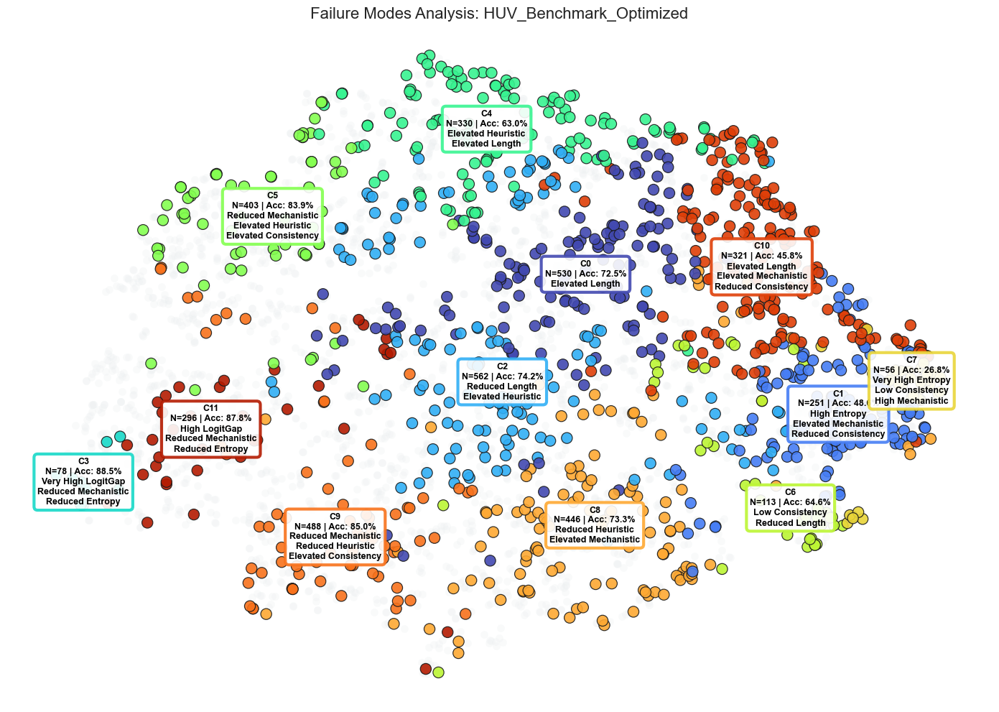

### Full Logistic Regression Analysis

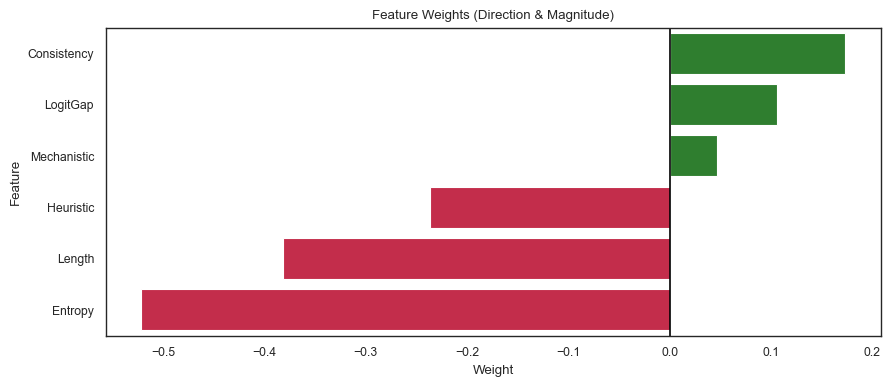

              precision    recall  f1-score   support

           0       0.45      0.60      0.51       558
           1       0.81      0.70      0.75      1378

    accuracy                           0.67      1936
   macro avg       0.63      0.65      0.63      1936
weighted avg       0.71      0.67      0.68      1936



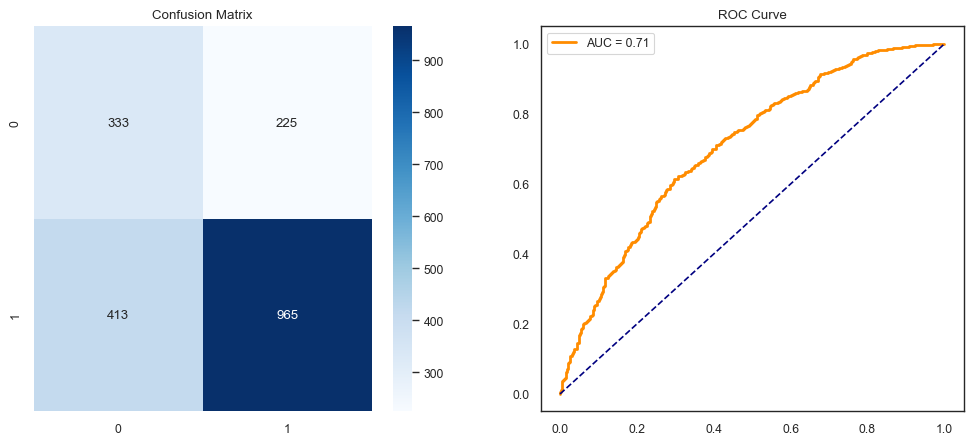

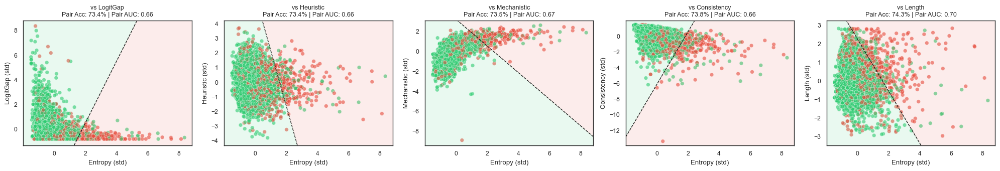

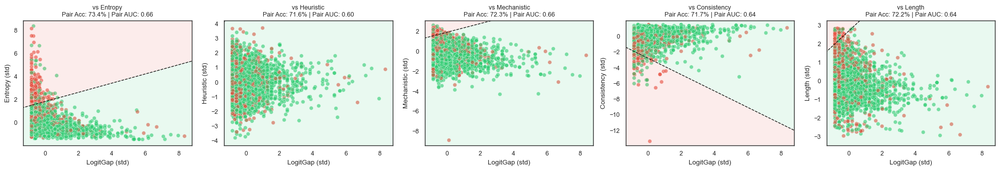

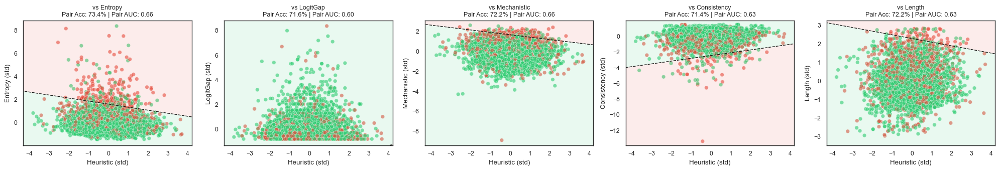

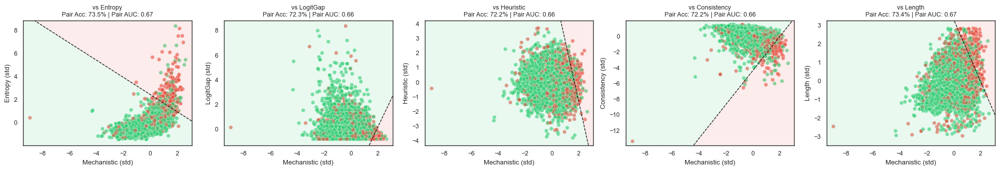

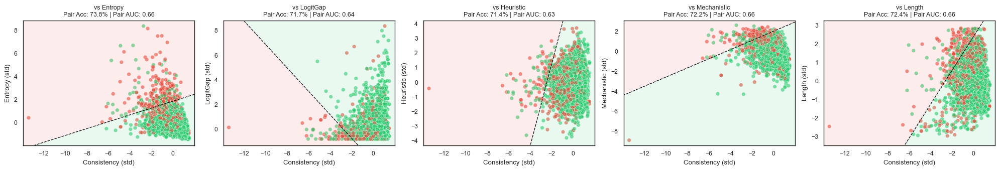

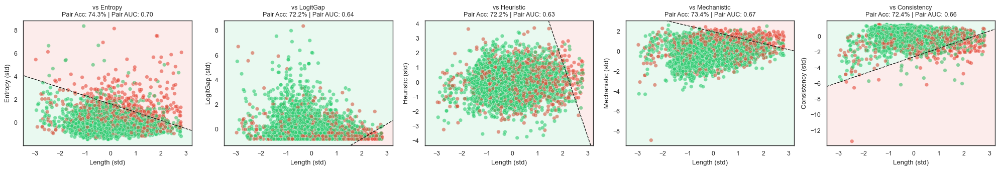

In [7]:
import analysis_utils as utils
import importlib
importlib.reload(utils)

df, metrics, exp_info = utils.load_data_universal("db/results.sqlite")

metrics_to_use = ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency', 'Length']

# 1. Collect the Clustering Model (for Failure Modes)
# This now returns a PredictorArtifact with mode='clustering'
failure_mode_predictor = utils.run_failure_modes_dashboard(df, exp_info, features=metrics_to_use)

# 2. Collect the Supervised Classifier
# 'run_feature_subset_search' does not return a model. 
# Call 'run_detailed_logistic_regression' to get the trained classifier artifact.
classifier_predictor = utils.run_detailed_logistic_regression(df, features=metrics_to_use)

# 3. (Optional) Collect Single-Metric Predictors
# If you want the individual predictors for specific metrics
single_metric_predictors = utils.run_full_analysis(df, metrics=metrics_to_use)

# --- usage example ---
# print(classifier_predictor(df.iloc[0]))

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, brier_score_loss
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown
import numpy as np
import pandas as pd

# --- 1. CONFIGURATION & HELPERS ---

# Define the strict display order for all tables
MODEL_ORDER = ['Logistic Fusion', 'Cluster Baseline', 'Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency']

def normalize_to_confidence(series, metric_name):
    """Transforms raw metric into a 0-1 Confidence Probability proxy."""
    s = series.fillna(series.mean())
    is_inverse = metric_name in ['Entropy', 'LogitGap', 'Length', 'Semantic']
    if s.max() == s.min(): return np.zeros_like(s) + 0.5
    norm_val = (s - s.min()) / (s.max() - s.min())
    final = (1 - norm_val) if is_inverse else norm_val
    return np.clip(final, 0.0, 1.0)

def compute_ece(probs, y_true, n_bins=10):
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        mask = (probs > bin_boundaries[i]) & (probs <= bin_boundaries[i+1])
        if not np.any(mask): continue
        bin_prob = np.mean(probs[mask])
        bin_acc = np.mean(y_true[mask])
        ece += np.abs(bin_prob - bin_acc) * (np.sum(mask) / len(probs))
    return ece

# --- 2. PREPARE ALL PREDICTIONS ---

# A. Logistic Predictions
probs_fusion, _ = classifier_artifact(df)
df['Logistic Fusion'] = probs_fusion

# B. Cluster Predictions
_, labels = cluster_predictor(df)
df['Cluster_Label'] = labels
cluster_accs = df.groupby('Cluster_Label')['Correct'].mean()
df['Cluster Baseline'] = df['Cluster_Label'].map(cluster_accs)

# C. Normalize Single Metrics
for m in metrics_to_use:
    if m in MODEL_ORDER:
        df[m] = normalize_to_confidence(df[m], m)

# --- 3. GLOBAL DATASET PERFORMANCE (Top Section) ---
# 
# 

global_stats = []
for model in MODEL_ORDER:
    if model not in df.columns: continue
    
    probs = df[model]
    auroc = roc_auc_score(df['Correct'], probs)
    ece = compute_ece(probs.values, df['Correct'].values)
    brier = brier_score_loss(df['Correct'], probs) # MSE
    
    global_stats.append({
        'Model': model,
        'AUROC (↑)': auroc,
        'ECE (↓)': ece,
        'MSE (↓)': brier
    })

g_df = pd.DataFrame(global_stats).set_index('Model')
best_mse = g_df['MSE (↓)'].min()
g_df['Status'] = g_df['MSE (↓)'].apply(lambda x: '🏆 Winner' if x == best_mse else '')

display(HTML("<h2>🌍 Overall Dataset Performance</h2>"))
display(HTML(g_df.style.background_gradient(cmap='Greens', subset=['AUROC (↑)'])
             .background_gradient(cmap='Reds', subset=['ECE (↓)', 'MSE (↓)'])
             .format("{:.4f}", subset=['AUROC (↑)', 'ECE (↓)', 'MSE (↓)']) # <--- FIXED HERE
             .to_html()))

# --- 4. CLUSTER DEEP DIVE (Fixed Order) ---

CSS = """
<style>
    .cl-card { font-family:'Segoe UI', sans-serif; border:1px solid #ddd; border-radius:8px; margin-bottom:25px; box-shadow:0 3px 6px rgba(0,0,0,0.05); overflow:hidden; background:white; }
    .cl-head { padding:10px 15px; border-bottom:1px solid #eee; display:flex; justify-content:space-between; align-items:center; background:#f8f9fa; }
    
    /* 4-Column Grid */
    .cl-grid { display:grid; grid-template-columns: 20% 25% 25% 30%; }
    .cl-col { padding:12px; border-right:1px solid #eee; font-size:0.85em; }
    .cl-col:last-child { border-right:none; background:#fafafa; }
    
    /* Bars */
    .bar-row { display:flex; align-items:center; margin-bottom:5px; }
    .bar-label { width:90px; color:#555; white-space:nowrap; overflow:hidden; text-overflow:ellipsis; font-size:0.9em; }
    .bar-track { flex:1; height:14px; background:#e0e0e0; border-radius:3px; overflow:hidden; margin-right:8px; }
    .bar-val { height:100%; display:flex; align-items:center; padding-left:4px; font-size:0.7em; color:white; font-weight:bold; }
    
    /* Sanity Table */
    .sanity-tbl { width:100%; border-collapse:collapse; font-size:0.85em; }
    .sanity-tbl td { padding:2px 4px; border-bottom:1px solid #eee; color:#444; text-align:right; }
    .sanity-tbl td:first-child { text-align:left; font-weight:500; }
    .sanity-tbl th { text-align:right; padding:2px 4px; border-bottom:2px solid #ddd; color:#777; font-weight:600; font-size:0.8em; }
    .sanity-tbl th:first-child { text-align:left; }
    .warn-val { color: #c0392b; font-weight:bold; }
</style>
"""

html = [CSS, "<h2>🔍 Deep Dive: Per-Cluster Model Validation</h2>"]

for label in df['Cluster_Label'].value_counts().index:
    sub = df[df['Cluster_Label'] == label]
    n = len(sub)
    if n < 3: continue 
    
    acc = sub['Correct'].mean()
    acc_color = "#27ae60" if acc > 0.7 else ("#e67e22" if acc > 0.4 else "#c0392b")

    # --- COL 1: PROFILE ---
    profile_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>Cluster Profile</div>"
    for m in metrics_to_use:
        z = (sub[m].mean() - df[m].mean()) / df[m].std()
        if abs(z) < 0.25: continue
        arrow = "⬆" if z > 0 else "⬇"
        color = "#c0392b" if z > 0 else "#2980b9"
        profile_html += f"<div style='border-bottom:1px dashed #eee; padding:2px 0;'><b>{m}</b>: <span style='color:{color}'>{arrow} {abs(z):.1f}σ</span></div>"

    # --- COL 2: PREDICTION BARS ---
    preds_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>Avg Confidence</div>"
    preds_html += f"<div class='bar-row'><div class='bar-label' style='font-weight:bold'>ACTUAL</div><div class='bar-track'><div class='bar-val' style='width:{acc*100}%; background:{acc_color}'>{acc:.1%}</div></div></div><hr style='margin:4px 0; border:0; border-top:1px solid #eee'>"
    
    for model in MODEL_ORDER:
        if model not in df.columns: continue
        conf = sub[model].mean()
        # Highlight Logistic & Cluster Base slightly differently
        bg = "#2c3e50" if model == 'Logistic Fusion' else ("#7f8c8d" if model == 'Cluster Baseline' else "#95a5a6")
        if abs(conf - acc) > 0.2 and model != 'Logistic Fusion': bg = "#e74c3c" # Red flag for bad single metrics
        
        preds_html += f"<div class='bar-row'><div class='bar-label'>{model}</div><div class='bar-track'><div class='bar-val' style='width:{conf*100}%; background:{bg}'>{conf:.0%}</div></div></div>"

    # --- COL 3: MSE SHOOTOUT (Fixed Order + Trophy) ---
    shootout_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>MSE (Lower is Better)</div>"
    
    # Calculate all errors first to find winner
    errors = {m: brier_score_loss(sub['Correct'], sub[m]) for m in MODEL_ORDER if m in df.columns}
    min_err = min(errors.values())
    max_err = max(errors.values()) + 0.001
    
    for model in MODEL_ORDER:
        if model not in errors: continue
        mse = errors[model]
        
        width = (mse / max_err) * 100
        is_winner = (mse == min_err)
        
        # Visual Styles
        star = "🏆 " if is_winner else ""
        weight = "bold" if is_winner else "normal"
        color = "#27ae60" if is_winner else "#95a5a6"
        if model == 'Logistic Fusion': color = "#2c3e50" # Keep Logistic distinct even if not winning
        
        shootout_html += f"""
        <div style='display:flex; align-items:center; margin-bottom:4px; font-weight:{weight}; font-size:0.85em'>
            <div style='width:90px; overflow:hidden; white-space:nowrap; text-overflow:ellipsis'>{star}{model}</div>
            <div style='flex:1; height:10px; background:#eee; margin:0 5px; border-radius:2px'>
                <div style='width:{width}%; background:{color}; height:100%'></div>
            </div>
            <div style='width:40px; text-align:right; font-family:monospace'>{mse:.3f}</div>
        </div>
        """

    # --- COL 4: SANITY STATS (All Models) ---
    sanity_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>Prob Stats (Mean | Med | Rng)</div>"
    sanity_html += "<table class='sanity-tbl'><thead><tr><th>Model</th><th>Mn</th><th>Md</th><th>Range</th></tr></thead><tbody>"
    
    for model in MODEL_ORDER:
        if model not in df.columns: continue
        vals = sub[model]
        mn, md = vals.mean(), vals.median()
        rng = vals.max() - vals.min()
        
        # Warning for collapsed predictions
        style = "color:#c0392b; font-weight:bold" if rng < 0.001 and model != 'Cluster Baseline' else ""
        
        sanity_html += f"""
        <tr style='{style}'>
            <td>{model}</td>
            <td>{mn:.2f}</td>
            <td>{md:.2f}</td>
            <td>{rng:.2f}</td>
        </tr>
        """
    sanity_html += "</tbody></table>"

    # --- ASSEMBLE ---
    card = f"""
    <div class="cl-card">
        <div class="cl-head" style="border-left:5px solid {acc_color}">
            <div style="font-weight:bold; font-size:1.1em">{label.splitlines()[0]}</div>
            <div>n={n} | Acc: {acc:.1%}</div>
        </div>
        <div class="cl-grid">
            <div class="cl-col">{profile_html}</div>
            <div class="cl-col">{preds_html}</div>
            <div class="cl-col">{shootout_html}</div>
            <div class="cl-col">{sanity_html}</div>
        </div>
    </div>
    """
    html.append(card)

display(HTML("".join(html)))

,AUROC (↑),ECE (↓),MSE (↓),Status
Model,,,,
Logistic Fusion,0.6678,0.5901,0.5435,
Cluster Baseline,0.5828,0.0000,0.1935,🏆 Winner
Entropy,0.6518,0.1345,0.2064,
LogitGap,0.4023,0.2386,0.2665,
Heuristic,0.4704,0.2264,0.2706,
Mechanistic,0.3430,0.1424,0.2323,
Consistency,0.6232,0.1822,0.2302,


Model,Mn,Md,Range
Logistic Fusion,0.11,0.08,0.61
Cluster Baseline,0.73,0.73,0.00
Entropy,0.87,0.88,0.50
LogitGap,0.93,0.95,0.32
Heuristic,0.53,0.53,0.77
Mechanistic,0.76,0.77,0.49
Consistency,0.91,0.92,0.54
Model,Mn,Md,Range
Logistic Fusion,0.24,0.22,0.70
Cluster Baseline,0.69,0.69,0.00


In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, brier_score_loss
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown
import numpy as np

# --- 1. HELPERS ---

def normalize_to_confidence(series, metric_name):
    """Transforms raw metric into a 0-1 Confidence Probability proxy."""
    # 1. Fill NaNs
    s = series.fillna(series.mean())
    
    # 2. Determine Direction
    is_inverse = metric_name in ['Entropy', 'LogitGap', 'Length', 'Semantic']
    
    # 3. Min-Max Scale
    if s.max() == s.min(): return np.zeros_like(s) + 0.5
    norm_val = (s - s.min()) / (s.max() - s.min())
    
    # 4. Invert if needed
    final = (1 - norm_val) if is_inverse else norm_val
    
    # 5. Safety Clip (Strict 0-1)
    return np.clip(final, 0.0, 1.0)

# --- 2. PREPARE PREDICTIONS ---

# A. Logistic Predictions
probs_fusion, _ = classifier_artifact(df)
df['Fusion_Prob'] = probs_fusion

# B. Cluster Predictions
_, labels = cluster_predictor(df)
df['Cluster_Label'] = labels
cluster_accs = df.groupby('Cluster_Label')['Correct'].mean()
df['Cluster_Base_Prob'] = df['Cluster_Label'].map(cluster_accs)

# C. Normalize Single Metrics
for m in metrics_to_use:
    df[f'Conf_{m}'] = normalize_to_confidence(df[m], m)

# --- 3. CLUSTER DEEP DIVE ---

CSS = """
<style>
    .cl-card { font-family:'Segoe UI', sans-serif; border:1px solid #ddd; border-radius:8px; margin-bottom:25px; box-shadow:0 3px 6px rgba(0,0,0,0.05); overflow:hidden; background:white; }
    .cl-head { padding:10px 15px; border-bottom:1px solid #eee; display:flex; justify-content:space-between; align-items:center; background:#f8f9fa; }
    
    /* 4-Column Grid */
    .cl-grid { display:grid; grid-template-columns: 20% 30% 25% 25%; }
    .cl-col { padding:12px; border-right:1px solid #eee; font-size:0.85em; }
    .cl-col:last-child { border-right:none; background:#fafafa; }
    
    /* Bars */
    .bar-row { display:flex; align-items:center; margin-bottom:4px; }
    .bar-label { width:80px; color:#555; white-space:nowrap; overflow:hidden; text-overflow:ellipsis; font-size:0.9em; }
    .bar-track { flex:1; height:14px; background:#e0e0e0; border-radius:3px; overflow:hidden; margin-right:8px; }
    .bar-val { height:100%; display:flex; align-items:center; padding-left:4px; font-size:0.7em; color:white; font-weight:bold; }
    
    /* Sanity Table */
    .sanity-tbl { width:100%; border-collapse:collapse; font-size:0.85em; }
    .sanity-tbl td { padding:2px 4px; border-bottom:1px solid #eee; color:#444; }
    .sanity-tbl th { text-align:left; padding:2px 4px; border-bottom:2px solid #ddd; color:#777; font-weight:600; font-size:0.8em; }
    .warn-val { color: #c0392b; font-weight:bold; }
</style>
"""

html = [CSS, "<h2>🔍 Deep Dive: Multi-Model Error Analysis</h2>"]

for label in df['Cluster_Label'].value_counts().index:
    sub = df[df['Cluster_Label'] == label]
    n = len(sub)
    if n < 3: continue 
    
    acc = sub['Correct'].mean()
    acc_color = "#27ae60" if acc > 0.7 else ("#e67e22" if acc > 0.4 else "#c0392b")

    # --- COL 1: PROFILE ---
    profile_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>Cluster Profile</div>"
    for m in metrics_to_use:
        z = (sub[m].mean() - df[m].mean()) / df[m].std()
        if abs(z) < 0.25: continue
        arrow = "⬆" if z > 0 else "⬇"
        color = "#c0392b" if z > 0 else "#2980b9"
        profile_html += f"<div style='border-bottom:1px dashed #eee; padding:2px 0;'><b>{m}</b>: <span style='color:{color}'>{arrow} {abs(z):.1f}σ</span></div>"

    # --- COL 2: PREDICTION BARS (Avg Confidence) ---
    preds_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>Avg Confidence</div>"
    # Truth
    preds_html += f"<div class='bar-row'><div class='bar-label' style='font-weight:bold'>ACTUAL</div><div class='bar-track'><div class='bar-val' style='width:{acc*100}%; background:{acc_color}'>{acc:.1%}</div></div></div><hr style='margin:4px 0; border:0; border-top:1px solid #eee'>"
    
    # Logistic
    log_conf = sub['Fusion_Prob'].mean()
    preds_html += f"<div class='bar-row'><div class='bar-label'><b>Logistic</b></div><div class='bar-track'><div class='bar-val' style='width:{log_conf*100}%; background:#2c3e50'>{log_conf:.1%}</div></div></div>"
    
    # Singles
    for m in metrics_to_use:
        conf = sub[f'Conf_{m}'].mean()
        color = "#95a5a6" if abs(conf - acc) < 0.15 else "#e74c3c"
        preds_html += f"<div class='bar-row'><div class='bar-label'>{m}</div><div class='bar-track'><div class='bar-val' style='width:{conf*100}%; background:{color}'>{conf:.0%}</div></div></div>"

    # --- COL 3: MSE SHOOTOUT (All Models) ---
    # Calculate MSE for EVERYTHING
    model_errors = []
    
    # 1. Cluster Baseline
    mse_cl = brier_score_loss(sub['Correct'], sub['Cluster_Base_Prob'])
    model_errors.append(('Cluster Base', mse_cl, '#7f8c8d'))
    
    # 2. Logistic
    mse_log = brier_score_loss(sub['Correct'], sub['Fusion_Prob'])
    model_errors.append(('Logistic', mse_log, '#2c3e50'))
    
    # 3. Singles
    for m in metrics_to_use:
        mse = brier_score_loss(sub['Correct'], sub[f'Conf_{m}'])
        model_errors.append((m, mse, '#95a5a6'))
        
    # Sort by Error (Low is Good)
    model_errors.sort(key=lambda x: x[1])
    
    shootout_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>MSE (Lower is Better)</div>"
    max_mse = max(x[1] for x in model_errors)
    
    for name, mse, color in model_errors:
        width = (mse / max_mse) * 100 if max_mse > 0 else 0
        is_winner = (mse == model_errors[0][1])
        weight = "bold" if is_winner else "normal"
        star = "🏆 " if is_winner else ""
        
        shootout_html += f"""
        <div style='display:flex; align-items:center; margin-bottom:3px; font-weight:{weight}'>
            <div style='width:70px; overflow:hidden; white-space:nowrap; text-overflow:ellipsis'>{star}{name}</div>
            <div style='flex:1; height:12px; background:#eee; margin:0 5px; border-radius:2px'>
                <div style='width:{width}%; background:{color}; height:100%'></div>
            </div>
            <div style='width:40px; text-align:right; font-family:monospace'>{mse:.3f}</div>
        </div>
        """

    # --- COL 4: NUMERICAL SANITY (Stats) ---
    sanity_html = "<div style='color:#777; font-weight:bold; margin-bottom:5px'>Prob Stats (Sanity)</div>"
    sanity_html += "<table class='sanity-tbl'><thead><tr><th>Model</th><th>Mean</th><th>Med</th><th>Range</th></tr></thead><tbody>"
    
    # Define which models to check (Logistic + Cluster + Top Single?)
    # Let's just do Logistic and the Best Single Metric from the shootout
    best_single = [x for x in model_errors if x[0] not in ['Logistic', 'Cluster Base']][0][0]
    check_list = ['Logistic', 'Cluster Base', best_single]
    
    # Map names to columns
    col_map = {'Logistic': 'Fusion_Prob', 'Cluster Base': 'Cluster_Base_Prob'}
    for m in metrics_to_use: col_map[m] = f'Conf_{m}'
        
    for name in check_list:
        if name not in col_map: continue
        vals = sub[col_map[name]]
        
        mn = vals.mean()
        md = vals.median()
        v_min, v_max = vals.min(), vals.max()
        
        # Check warnings
        rng_cls = "warn-val" if (v_max - v_min) < 0.001 and name != 'Cluster Base' else ""
        
        sanity_html += f"""
        <tr>
            <td>{name}</td>
            <td>{mn:.2f}</td>
            <td>{md:.2f}</td>
            <td class='{rng_cls}'>{v_min:.2f}-{v_max:.2f}</td>
        </tr>
        """
    sanity_html += "</tbody></table>"
    if "warn-val" in sanity_html:
        sanity_html += "<div style='font-size:0.75em; color:#c0392b; margin-top:5px'>⚠️ Constant/Collapsed</div>"

    # --- ASSEMBLE ---
    card = f"""
    <div class="cl-card">
        <div class="cl-head" style="border-left:5px solid {acc_color}">
            <div style="font-weight:bold; font-size:1.1em">{label.splitlines()[0]}</div>
            <div>n={n} | Acc: {acc:.1%}</div>
        </div>
        <div class="cl-grid">
            <div class="cl-col">{profile_html}</div>
            <div class="cl-col">{preds_html}</div>
            <div class="cl-col">{shootout_html}</div>
            <div class="cl-col">{sanity_html}</div>
        </div>
    </div>
    """
    html.append(card)

display(HTML("".join(html)))

Model,Mean,Med,Range
Logistic,0.11,0.08,0.00-0.61
Cluster Base,0.73,0.73,0.73-0.73
Entropy,0.87,0.88,0.50-0.99
Model,Mean,Med,Range
Logistic,0.24,0.22,0.01-0.71
Cluster Base,0.69,0.69,0.69-0.69
Entropy,0.83,0.84,0.60-0.97
Model,Mean,Med,Range
Logistic,0.26,0.23,0.00-0.75
Cluster Base,0.88,0.88,0.88-0.88


In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, brier_score_loss
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown

# --- 1. HELPERS ---

def normalize_to_confidence(series, metric_name):
    """Transforms raw metric into a 0-1 Confidence Probability proxy."""
    s = series.fillna(series.mean())
    is_inverse = metric_name in ['Entropy', 'LogitGap', 'Length', 'Semantic']
    if s.max() == s.min(): return np.zeros_like(s) + 0.5
    norm = (s - s.min()) / (s.max() - s.min())
    return (1 - norm) if is_inverse else norm

# --- 2. PREPARE PREDICTIONS ---

# A. Logistic Predictions
probs_fusion, _ = classifier_artifact(df)
df['Fusion_Prob'] = probs_fusion

# B. Cluster Predictions (The Baseline)
_, labels = cluster_predictor(df)
df['Cluster_Label'] = labels
cluster_accs = df.groupby('Cluster_Label')['Correct'].mean()
df['Cluster_Base_Prob'] = df['Cluster_Label'].map(cluster_accs)

# C. Normalize Single Metrics
for m in metrics_to_use:
    df[f'Conf_{m}'] = normalize_to_confidence(df[m], m)

# --- 3. CLUSTER DEEP DIVE (EXPLICIT ERROR SHOOTOUT) ---

CSS = """
<style>
    .cl-card { font-family:'Segoe UI', sans-serif; border:1px solid #ddd; border-radius:8px; margin-bottom:25px; box-shadow:0 3px 6px rgba(0,0,0,0.05); overflow:hidden; background:white; }
    .cl-head { padding:10px 15px; border-bottom:1px solid #eee; display:flex; justify-content:space-between; align-items:center; background:#f8f9fa; }
    .cl-grid { display:grid; grid-template-columns: 25% 40% 35%; } /* Adjusted width for right col */
    .cl-col { padding:15px; border-right:1px solid #eee; }
    .cl-col:last-child { border-right:none; background:#fafafa; } /* Grey background for eval col */
    
    .bar-row { display:flex; align-items:center; margin-bottom:6px; font-size:0.85em; }
    .bar-label { width:85px; color:#555; white-space:nowrap; overflow:hidden; text-overflow:ellipsis; }
    .bar-track { flex:1; height:18px; background:#e0e0e0; border-radius:3px; overflow:hidden; margin-right:8px; position:relative; }
    .bar-val { height:100%; display:flex; align-items:center; padding-left:4px; font-size:0.75em; color:white; font-weight:bold; }
    
    .err-val { font-family:monospace; font-weight:bold; color:#444; }
    .win-tag { font-size:0.75em; font-weight:bold; padding:2px 6px; border-radius:4px; margin-left:5px; }
</style>
"""

html = [CSS, "<h2>🔍 Deep Dive: Logistic vs. Cluster Error Analysis</h2>"]

for label in df['Cluster_Label'].value_counts().index:
    sub = df[df['Cluster_Label'] == label]
    n = len(sub)
    if n < 3: continue 
    
    acc = sub['Correct'].mean()
    acc_color = "#27ae60" if acc > 0.7 else ("#e67e22" if acc > 0.4 else "#c0392b")

    # --- COL 1: PROFILE ---
    profile_html = "<div style='font-size:0.85em; color:#666; margin-bottom:8px'>Feature Deviations</div>"
    for m in metrics_to_use:
        z = (sub[m].mean() - df[m].mean()) / df[m].std()
        if abs(z) < 0.25: continue
        arrow = "⬆" if z > 0 else "⬇"
        color = "#c0392b" if z > 0 else "#2980b9"
        profile_html += f"<div style='border-bottom:1px dashed #eee; padding:3px 0;'><b>{m}</b>: <span style='color:{color}'>{arrow} {abs(z):.1f}σ</span></div>"

    # --- COL 2: PREDICTION MONITOR ---
    preds_html = "<div style='font-size:0.85em; color:#666; margin-bottom:8px'>Avg Confidence vs Truth</div>"
    preds_html += f"<div class='bar-row'><div class='bar-label' style='font-weight:bold'>ACTUAL</div><div class='bar-track'><div class='bar-val' style='width:{acc*100}%; background:{acc_color}'>{acc:.1%}</div></div></div><hr style='margin:5px 0; border:0; border-top:1px solid #eee'>"
    
    log_conf = sub['Fusion_Prob'].mean()
    preds_html += f"<div class='bar-row'><div class='bar-label'><b>Logistic</b></div><div class='bar-track'><div class='bar-val' style='width:{log_conf*100}%; background:#2c3e50'>{log_conf:.1%}</div></div></div>"
    
    for m in metrics_to_use:
        conf = sub[f'Conf_{m}'].mean()
        color = "#95a5a6" if abs(conf - acc) < 0.15 else "#e74c3c"
        preds_html += f"<div class='bar-row'><div class='bar-label'>{m}</div><div class='bar-track'><div class='bar-val' style='width:{conf*100}%; background:{color}'>{conf:.0%}</div></div></div>"

    # --- COL 3: MSE SHOOTOUT (Explicit Errors) ---
    
    # 1. Calculate Brier Scores (MSE)
    mse_cluster = brier_score_loss(sub['Correct'], sub['Cluster_Base_Prob'])
    mse_logistic = brier_score_loss(sub['Correct'], sub['Fusion_Prob'])
    
    # 2. Scaling for Visualization (so bars are visible)
    max_mse = max(mse_cluster, mse_logistic) + 0.01
    w_cluster = (mse_cluster / max_mse) * 100
    w_logistic = (mse_logistic / max_mse) * 100
    
    # 3. Determine Winner
    if mse_logistic < mse_cluster:
        diff = mse_cluster - mse_logistic
        pct = (diff / mse_cluster) * 100
        winner_html = f"<div style='margin-top:10px; color:#27ae60; font-weight:bold; font-size:0.9em'>✅ Logistic Wins (-{pct:.1f}%)</div><div style='font-size:0.8em; color:#666'>Found signal within cluster.</div>"
        c_bar_col, l_bar_col = "#95a5a6", "#27ae60"
    elif mse_logistic > mse_cluster:
        diff = mse_logistic - mse_cluster
        pct = (diff / mse_cluster) * 100
        winner_html = f"<div style='margin-top:10px; color:#c0392b; font-weight:bold; font-size:0.9em'>❌ Cluster Wins (+{pct:.1f}%)</div><div style='font-size:0.8em; color:#666'>Logistic overfitted noise.</div>"
        c_bar_col, l_bar_col = "#27ae60", "#c0392b"
    else:
        winner_html = "<div style='margin-top:10px; color:#7f8c8d'>Draw (No Information Gain)</div>"
        c_bar_col, l_bar_col = "#95a5a6", "#95a5a6"

    # 4. Render Error Bars
    eval_html = f"""
    <div style='font-size:0.75em; color:#555; font-weight:bold; margin-bottom:10px'>MEAN SQUARED ERROR (Lower is Better)</div>
    
    <div style='display:flex; align-items:center; margin-bottom:5px'>
        <div style='width:60px; font-size:0.85em'>Cluster</div>
        <div class='bar-track' style='height:12px; background:#ddd'><div style='width:{w_cluster}%; background:{c_bar_col}; height:100%'></div></div>
        <div class='err-val'>{mse_cluster:.3f}</div>
    </div>

    <div style='display:flex; align-items:center'>
        <div style='width:60px; font-size:0.85em; font-weight:bold'>Logistic</div>
        <div class='bar-track' style='height:12px; background:#ddd'><div style='width:{w_logistic}%; background:{l_bar_col}; height:100%'></div></div>
        <div class='err-val'>{mse_logistic:.3f}</div>
    </div>
    
    {winner_html}
    """
    
    card = f"""
    <div class="cl-card">
        <div class="cl-head" style="border-left:5px solid {acc_color}">
            <div style="font-weight:bold; font-size:1.1em">{label.splitlines()[0]}</div>
            <div>n={n} | Acc: {acc:.1%}</div>
        </div>
        <div class="cl-grid">
            <div class="cl-col">{profile_html}</div>
            <div class="cl-col">{preds_html}</div>
            <div class="cl-col">{eval_html}</div>
        </div>
    </div>
    """
    html.append(card)

display(HTML("".join(html)))

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown

# --- 1. HELPERS & NORMALIZATION ---

def normalize_to_confidence(series, metric_name):
    """
    Transforms raw metric into a 0-1 Confidence Probability proxy.
    Handles directionality (e.g., High Entropy = Low Confidence).
    """
    s = series.fillna(series.mean())
    
    # 1. Determine Direction (Correlation)
    # If correlation is negative (like Entropy), we invert.
    # We assume global direction holds locally for normalization.
    is_inverse = metric_name in ['Entropy', 'LogitGap', 'Length', 'Semantic']
    
    # 2. Min-Max Scale to 0-1
    if s.max() == s.min(): return np.zeros_like(s) + 0.5
    norm = (s - s.min()) / (s.max() - s.min())
    
    return (1 - norm) if is_inverse else norm

# --- 2. PREPARE DATA ---

# A. Logistic Predictions
probs_fusion, _ = classifier_artifact(df)
df['Fusion_Prob'] = probs_fusion

# B. Cluster Predictions
_, labels = cluster_predictor(df)
df['Cluster_Label'] = labels
# Calculate the "Baseline Probability" (Mean accuracy of the cluster)
cluster_accs = df.groupby('Cluster_Label')['Correct'].mean()
df['Cluster_Base_Prob'] = df['Cluster_Label'].map(cluster_accs)

# C. Normalize Single Metrics for Comparison
for m in metrics_to_use:
    df[f'Conf_{m}'] = normalize_to_confidence(df[m], m)

# --- 3. CLUSTER DEEP DIVE VISUALIZATION ---

CSS = """
<style>
    .cl-card { font-family:'Segoe UI', sans-serif; border:1px solid #ddd; border-radius:8px; margin-bottom:25px; box-shadow:0 3px 6px rgba(0,0,0,0.05); overflow:hidden; background:white; }
    .cl-head { padding:10px 15px; border-bottom:1px solid #eee; display:flex; justify-content:space-between; align-items:center; background:#f8f9fa; }
    .cl-grid { display:grid; grid-template-columns: 25% 45% 30%; }
    .cl-col { padding:15px; border-right:1px solid #eee; }
    .cl-col:last-child { border-right:none; }
    
    /* Bars */
    .bar-row { display:flex; align-items:center; margin-bottom:6px; font-size:0.85em; }
    .bar-label { width:90px; color:#555; white-space:nowrap; overflow:hidden; text-overflow:ellipsis; }
    .bar-track { flex:1; height:18px; background:#f0f0f0; border-radius:3px; overflow:hidden; margin-right:8px; position:relative; }
    .bar-val { height:100%; display:flex; align-items:center; padding-left:4px; font-size:0.75em; color:white; font-weight:bold; }
    
    /* Stats */
    .stat-badge { font-size:0.8em; padding:2px 6px; border-radius:4px; background:#eee; color:#444; margin-bottom:4px; display:inline-block; }
    .gain-pos { color: #27ae60; font-weight:bold; }
    .gain-neg { color: #c0392b; font-weight:bold; }
</style>
"""

html = [CSS, "<h2>🔍 Deep Dive: Logistic vs. Cluster Baselines</h2>"]

# Iterate Clusters by size
for label in df['Cluster_Label'].value_counts().index:
    sub = df[df['Cluster_Label'] == label]
    n = len(sub)
    if n < 3: continue 
    
    acc = sub['Correct'].mean()
    acc_color = "#27ae60" if acc > 0.7 else ("#e67e22" if acc > 0.4 else "#c0392b")

    # --- COLUMN 1: PROFILE (Who are they?) ---
    profile_html = "<div style='font-size:0.85em; color:#666; margin-bottom:8px'>Feature Deviations (Z-Score)</div>"
    for m in metrics_to_use:
        z = (sub[m].mean() - df[m].mean()) / df[m].std()
        if abs(z) < 0.25: continue # Filter noise
        
        arrow = "⬆" if z > 0 else "⬇"
        color = "#c0392b" if z > 0 else "#2980b9" # Red = High Value, Blue = Low Value
        profile_html += f"<div style='border-bottom:1px dashed #eee; padding:3px 0;'><b>{m}</b>: <span style='color:{color}'>{arrow} {abs(z):.1f}σ</span></div>"

    # --- COLUMN 2: PREDICTION MONITOR (What did everyone think?) ---
    # Compare "Actual Accuracy" vs "Metric Confidence"
    preds_html = "<div style='font-size:0.85em; color:#666; margin-bottom:8px'>Predicted Confidence vs Truth</div>"
    
    # 1. Actual
    preds_html += f"""
    <div class='bar-row'>
        <div class='bar-label' style='font-weight:bold'>ACTUAL</div>
        <div class='bar-track'><div class='bar-val' style='width:{acc*100}%; background:{acc_color}'>{acc:.1%}</div></div>
    </div><hr style='margin:5px 0; border:0; border-top:1px solid #eee'>
    """
    
    # 2. Logistic
    log_conf = sub['Fusion_Prob'].mean()
    preds_html += f"""
    <div class='bar-row'>
        <div class='bar-label'><b>Logistic (Fusion)</b></div>
        <div class='bar-track'><div class='bar-val' style='width:{log_conf*100}%; background:#2c3e50'>{log_conf:.1%}</div></div>
    </div>
    """
    
    # 3. Individual Metrics
    for m in metrics_to_use:
        conf = sub[f'Conf_{m}'].mean()
        # Visual diff: is this metric way off?
        color = "#95a5a6" if abs(conf - acc) < 0.15 else "#e74c3c" 
        preds_html += f"""
        <div class='bar-row'>
            <div class='bar-label'>{m}</div>
            <div class='bar-track'><div class='bar-val' style='width:{conf*100}%; background:{color}'>{conf:.0%}</div></div>
        </div>
        """

    # --- COLUMN 3: VALUE ADD EVALUATION (Did Logistic beat Cluster Mean?) ---
    # We calculate Log Loss within this specific cluster
    
    # Baseline: Loss if we just predicted the cluster mean for everyone
    try:
        base_loss = log_loss(sub['Correct'], sub['Cluster_Base_Prob'])
        # Challenger: Loss using Logistic probabilities
        log_loss_val = log_loss(sub['Correct'], sub['Fusion_Prob'])
        
        improvement = base_loss - log_loss_val # Positive = Logistic is better
        pct_improvement = (improvement / base_loss) * 100 if base_loss > 0 else 0
        
        if pct_improvement > 2.0:
            eval_text = f"<span class='gain-pos'>YES (+{pct_improvement:.1f}%)</span>"
            expl = "Logistic successfully discriminated <b>within</b> this cluster."
        elif pct_improvement < -1.0:
            eval_text = f"<span class='gain-neg'>NO ({pct_improvement:.1f}%)</span>"
            expl = "Logistic overfitted. The Cluster Mean was a safer bet."
        else:
            eval_text = "<span style='color:#7f8c8d'>NEUTRAL</span>"
            expl = "Logistic just learned the Cluster ID."
            
    except:
        eval_text = "N/A"
        expl = "Cluster too pure to evaluate (0 variance)."

    eval_html = f"""
    <div style='background:#f9f9f9; padding:10px; border-radius:5px;'>
        <div style='font-size:0.75em; color:#777; text-transform:uppercase; letter-spacing:0.5px'>Does Fusion beat Cluster ID?</div>
        <div style='font-size:1.4em; margin:5px 0'>{eval_text}</div>
        <div style='font-size:0.85em; line-height:1.3'>{expl}</div>
    </div>
    """
    
    # --- RENDER CARD ---
    card = f"""
    <div class="cl-card">
        <div class="cl-head" style="border-left:5px solid {acc_color}">
            <div style="font-weight:bold; font-size:1.1em">{label.splitlines()[0]}</div>
            <div>n={n} | Acc: {acc:.1%}</div>
        </div>
        <div class="cl-grid">
            <div class="cl-col">{profile_html}</div>
            <div class="cl-col">{preds_html}</div>
            <div class="cl-col" style="display:flex; align-items:center">{eval_html}</div>
        </div>
    </div>
    """
    html.append(card)

display(HTML("".join(html)))

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown

# --- 1. VALIDATION HELPER FUNCTIONS ---

def compute_ece(probs, y_true, n_bins=10):
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        mask = (probs > bin_boundaries[i]) & (probs <= bin_boundaries[i+1])
        if not np.any(mask): continue
        bin_prob = np.mean(probs[mask])
        bin_acc = np.mean(y_true[mask])
        ece += np.abs(bin_prob - bin_acc) * (np.sum(mask) / len(probs))
    return ece

def compute_auarc(uncertainty_scores, y_true):
    data = pd.DataFrame({'unc': uncertainty_scores, 'correct': y_true})
    data = data.sort_values('unc', ascending=True)
    rejection_rates = np.linspace(0, 0.95, 50)
    accuracies = []
    n = len(data)
    for r in rejection_rates:
        keep_n = int(n * (1 - r))
        if keep_n < 1: break
        accuracies.append(data.head(keep_n)['correct'].mean())
    return np.trapz(accuracies, rejection_rates)

# --- 2. PREPARE PREDICTIONS ---

probs_fusion, _ = classifier_artifact(df)
_, cluster_labels = cluster_predictor(df)
df['Cluster_Label'] = cluster_labels
df['Fusion_Prob'] = probs_fusion

# --- 3. GLOBAL METRICS TABLE (Summary) ---

results = []
for m in metrics_to_use:
    if m in ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Length']:
        # Normalize to [0,1] confidence for comparison
        raw = df[m].fillna(df[m].max())
        conf = 1 - ((raw - raw.min()) / (raw.max() - raw.min()))
    else:
        conf = df[m].fillna(0)
    
    results.append({
        'Method': m, 
        'Type': 'Single Signal',
        'AUROC': roc_auc_score(df['Correct'], conf),
        'ECE': compute_ece(conf.values, df['Correct'].values)
    })

results.append({
    'Method': '<b>Fusion (Logistic)</b>', 
    'Type': 'Supervised',
    'AUROC': roc_auc_score(df['Correct'], probs_fusion),
    'ECE': compute_ece(probs_fusion, df['Correct'].values)
})

display(HTML("<h2>🚀 Global Validation Report</h2>"))
display(HTML(pd.DataFrame(results).set_index('Method').style.background_gradient(cmap='Greens', subset=['AUROC']).to_html(escape=False)))

# --- 4. CLUSTER DEEP DIVE (The New Request) ---

CLUSTER_CSS = """
<style>
    .cl-card { border: 1px solid #e0e0e0; border-radius: 8px; margin-bottom: 20px; box-shadow: 0 2px 5px rgba(0,0,0,0.05); font-family: 'Segoe UI', sans-serif; overflow: hidden; }
    .cl-header { padding: 12px 20px; border-bottom: 1px solid #eee; display: flex; justify-content: space-between; align-items: center; }
    .cl-body { display: flex; padding: 15px; gap: 20px; }
    .cl-stats { flex: 1; border-right: 1px solid #eee; padding-right: 15px; }
    .cl-perf { flex: 1; padding-left: 5px; }
    .bar-bg { background: #f0f0f0; height: 20px; border-radius: 4px; overflow: hidden; position: relative; width: 100%; }
    .bar-fill { height: 100%; display: flex; align-items: center; padding-left: 5px; font-size: 0.75em; color: white; font-weight: bold; }
    .stat-row { display: flex; justify-content: space-between; font-size: 0.9em; padding: 4px 0; border-bottom: 1px dashed #eee; }
    .metric-name { color: #555; font-weight: 500; }
    .val-high { color: #c0392b; font-weight: bold; }
    .val-low { color: #2980b9; font-weight: bold; }
</style>
"""

html_out = [CLUSTER_CSS, "<h2>🔍 Deep Dive: Per-Cluster Reliability</h2>"]

# Sort clusters by size for relevance
sorted_clusters = df['Cluster_Label'].value_counts().index

for cl_label in sorted_clusters:
    sub = df[df['Cluster_Label'] == cl_label]
    n = len(sub)
    if n < 3: continue # Skip tiny clusters
    
    # 1. Basics
    acc = sub['Correct'].mean()
    acc_color = "#27ae60" if acc > 0.7 else ("#f39c12" if acc > 0.4 else "#c0392b")
    
    # 2. Profile (Z-scores)
    profile_html = ""
    for feat in metrics_to_use:
        # Calculate local Z-score relative to global stats
        z = (sub[feat].mean() - df[feat].mean()) / df[feat].std()
        if abs(z) < 0.3: continue # Skip average features
        
        color_cls = "val-high" if z > 0 else "val-low"
        dir_arrow = "⬆" if z > 0 else "⬇"
        profile_html += f"<div class='stat-row'><span class='metric-name'>{feat}</span><span class='{color_cls}'>{dir_arrow} {abs(z):.1f}σ</span></div>"

    if not profile_html: profile_html = "<div class='stat-row'><i>Average Feature Profile</i></div>"

    # 3. Model Performance Comparison
    # Compare Actual Accuracy vs Mean Predicted Confidence
    perf_html = ""
    
    # Actual
    perf_html += f"<div style='margin-bottom:8px'><small>Actual Accuracy</small><div class='bar-bg'><div class='bar-fill' style='width:{acc*100}%; background:{acc_color}'>{acc:.1%}</div></div></div>"
    
    # Logistic
    log_conf = sub['Fusion_Prob'].mean()
    log_diff = abs(log_conf - acc)
    log_color = "#2c3e50"
    perf_html += f"<div style='margin-bottom:15px'><small>Logistic Prediction (Fusion)</small><div class='bar-bg'><div class='bar-fill' style='width:{log_conf*100}%; background:{log_color}'>{log_conf:.1%}</div></div></div>"
    
    # Compare to single best metric (Entropy usually)
    ent_raw = sub['Entropy'].fillna(0)
    # Simple naive inversion for visualization: 1 - normalized_entropy
    ent_conf = 1 - (ent_raw / df['Entropy'].max()).clip(0,1) 
    ent_conf_mean = ent_conf.mean()
    
    # Interpretation Text
    if log_diff < abs(ent_conf_mean - acc) - 0.05:
        insight = f"✅ <b>Logistic Wins:</b> Fusion model correctly adjusted confidence ({log_conf:.2f}) closer to truth ({acc:.2f}) than Entropy ({ent_conf_mean:.2f})."
    elif log_diff > 0.2:
        insight = f"⚠️ <b>Miscalibration:</b> Logistic is over/under-confident (Diff: {log_diff:.2f})."
    else:
        insight = "ℹ️ <b>Parity:</b> Logistic performs similarly to single metrics."

    # 4. Assemble Card
    card = f"""
    <div class="cl-card">
        <div class="cl-header" style="border-left: 5px solid {acc_color}">
            <div><b>{cl_label.splitlines()[0]}</b> <span style="color:#777; font-size:0.9em">({cl_label.splitlines()[1] if len(cl_label.splitlines())>1 else ''})</span></div>
            <div style="font-weight:bold; color:{acc_color}">Acc: {acc:.1%} (n={n})</div>
        </div>
        <div class="cl-body">
            <div class="cl-stats">
                <h5 style="margin:0 0 10px 0; color:#333">Cluster Profile (deviations)</h5>
                {profile_html}
            </div>
            <div class="cl-perf">
                <h5 style="margin:0 0 10px 0; color:#333">Predictive Fidelity</h5>
                {perf_html}
                <div style="font-size:0.85em; color:#555; background:#f9f9f9; padding:5px; border-radius:4px; margin-top:5px">
                    {insight}
                </div>
            </div>
        </div>
    </div>
    """
    html_out.append(card)

display(HTML("".join(html_out)))

,Type,AUROC,ECE
Method,,,
Entropy,Single Signal,0.651795,0.134534
LogitGap,Single Signal,0.402333,0.238554
Heuristic,Single Signal,0.529599,0.229074
Mechanistic,Single Signal,0.656952,0.488915
Consistency,Single Signal,0.623199,0.212600
Length,Single Signal,0.623544,0.242811
Fusion (Logistic),Supervised,0.705498,0.190054


,Type,AUROC (↑),AUARC (↑),ECE (↓)
Method,,,,
Entropy,Single Signal,0.651795,0.755420,1.345336e-01
LogitGap,Single Signal,0.402333,0.630599,2.385536e-01
Heuristic,Single Signal,0.529599,0.689935,2.290736e-01
Mechanistic,Single Signal,0.656952,0.761679,4.889152e-01
Consistency,Single Signal,0.623199,0.750148,2.125999e-01
Length,Single Signal,0.623544,0.737932,2.428115e-01
Clustering (Mean Prob),Unsupervised*,0.680970,0.772911,7.316467e-17
Fusion Model (Logistic),Supervised,0.705498,0.783990,1.900536e-01


array([<Axes: title={'center': 'Accuracy-Rejection Curve [Image of accuracy rejection curve]'}, xlabel='Rejection Rate', ylabel='Accuracy on Retained'>,
       <Axes: title={'center': 'Reliability Diagram (Calibration) [Image of reliability diagram calibration curve]'}>,
       <Axes: >], dtype=object)

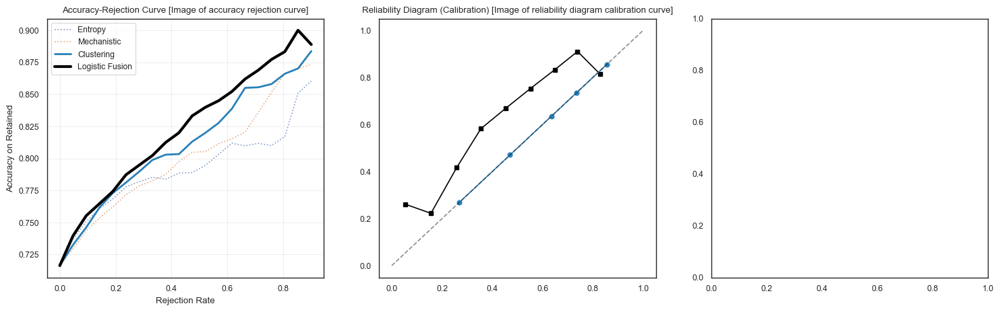

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, brier_score_loss
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown

# --- 1. VALIDATION HELPER FUNCTIONS ---

def compute_ece(probs, y_true, n_bins=10):
    """Calculates Expected Calibration Error (ECE)."""
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        mask = (probs > bin_boundaries[i]) & (probs <= bin_boundaries[i+1])
        if not np.any(mask): continue
        bin_prob = np.mean(probs[mask])
        bin_acc = np.mean(y_true[mask])
        ece += np.abs(bin_prob - bin_acc) * (np.sum(mask) / len(probs))
    return ece

def compute_auarc(uncertainty_scores, y_true):
    """Calculates Area Under Accuracy-Rejection Curve (AUARC)."""
    data = pd.DataFrame({'unc': uncertainty_scores, 'correct': y_true})
    data = data.sort_values('unc', ascending=True) # Low uncertainty = High Confidence
    
    rejection_rates = np.linspace(0, 0.95, 50)
    accuracies = []
    n = len(data)
    
    for r in rejection_rates:
        keep_n = int(n * (1 - r))
        if keep_n < 1: break
        subset = data.head(keep_n)
        accuracies.append(subset['correct'].mean())
        
    return np.trapz(accuracies, rejection_rates)

def wilson_score_interval(correct, total, confidence=0.95):
    if total == 0: return 0, 0
    p_hat = correct / total
    z = norm.ppf(1 - (1 - confidence) / 2)
    denominator = 1 + z**2/total
    center = (p_hat + z**2 / (2*total)) / denominator
    spread = z * np.sqrt((p_hat*(1-p_hat) + z**2/(4*total)) / total) / denominator
    return max(0, center - spread), min(1, center + spread)

# --- 2. PREPARE PREDICTIONS ---

# A. Logistic Regression (Fusion) Predictions
probs_fusion, _ = classifier_artifact(df)

# B. Clustering Predictions (NEW: Using Cluster Mean as Probability)
_, cluster_labels = cluster_predictor(df)
df['Cluster_Label'] = cluster_labels
# Calculate accuracy per cluster
cluster_means = df.groupby('Cluster_Label')['Correct'].mean()
# Map back to every sample: "Your probability is the average accuracy of your cluster"
probs_clustering = df['Cluster_Label'].map(cluster_means).values

# --- 3. COMPUTE METRICS TABLE ---

results = []

# 1. Single Metrics
for m in metrics_to_use:
    if m in ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Length']:
        # Invert so Higher = More Confident
        uncertainty = df[m].fillna(df[m].max())
        confidence_proxy = 1 - ((uncertainty - uncertainty.min()) / (uncertainty.max() - uncertainty.min()))
    else:
        confidence_proxy = df[m].fillna(0)
    
    results.append({
        'Method': m, 
        'Type': 'Single Signal',
        'AUROC (↑)': roc_auc_score(df['Correct'], confidence_proxy),
        'AUARC (↑)': compute_auarc(1-confidence_proxy, df['Correct']),
        'ECE (↓)': compute_ece(confidence_proxy.values, df['Correct'].values)
    })

# 2. Clustering (New)
results.append({
    'Method': '<b>Clustering (Mean Prob)</b>', 
    'Type': 'Unsupervised*',
    'AUROC (↑)': roc_auc_score(df['Correct'], probs_clustering),
    'AUARC (↑)': compute_auarc(1-probs_clustering, df['Correct']),
    'ECE (↓)': compute_ece(probs_clustering, df['Correct'].values)
})

# 3. Logistic Fusion
results.append({
    'Method': '<b>Fusion Model (Logistic)</b>', 
    'Type': 'Supervised',
    'AUROC (↑)': roc_auc_score(df['Correct'], probs_fusion),
    'AUARC (↑)': compute_auarc(1-probs_fusion, df['Correct']),
    'ECE (↓)': compute_ece(probs_fusion, df['Correct'].values)
})

display(HTML("<h2>🚀 Uncertainty Quantification Validation Report</h2>"))
display(HTML(pd.DataFrame(results).set_index('Method').to_html(escape=False)))

# --- 4. VISUALIZATIONS ---

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot A: Accuracy-Rejection Curves
rejection_rates = np.linspace(0, 0.9, 20)

# Baselines
for m in ['Entropy', 'Mechanistic']:
    data = pd.DataFrame({'unc': df[m], 'correct': df['Correct']}).sort_values('unc', ascending=True)
    accs = [data.head(int(len(data)*(1-r)))['correct'].mean() for r in rejection_rates]
    axes[0].plot(rejection_rates, accs, label=m, linestyle=':', alpha=0.7)

# Clustering
data_c = pd.DataFrame({'unc': 1-probs_clustering, 'correct': df['Correct']}).sort_values('unc')
accs_c = [data_c.head(int(len(data_c)*(1-r)))['correct'].mean() for r in rejection_rates]
axes[0].plot(rejection_rates, accs_c, label='Clustering', linewidth=2, color='#2980b9')

# Logistic Fusion
data_f = pd.DataFrame({'unc': 1-probs_fusion, 'correct': df['Correct']}).sort_values('unc')
accs_f = [data_f.head(int(len(data_f)*(1-r)))['correct'].mean() for r in rejection_rates]
axes[0].plot(rejection_rates, accs_f, label='Logistic Fusion', linewidth=3, color='black')

axes[0].set_title("Accuracy-Rejection Curve [Image of accuracy rejection curve]")
axes[0].set_xlabel("Rejection Rate")
axes[0].set_ylabel("Accuracy on Retained")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot B: Calibration
frac_pos, mean_pred = calibration_curve(df['Correct'], probs_fusion, n_bins=10)
axes[1].plot(mean_pred, frac_pos, "s-", color='black', label="Logistic")
frac_pos_c, mean_pred_c = calibration_curve(df['Correct'], probs_clustering, n_bins=10)
axes[1].plot(mean_pred_c, frac_pos_c, "o-", color='#2980b9', label="Clustering")
axes[1].plot([0, 1], [0, 1], "k--", alpha=0.5)
axes[1].set_title("Reliability Diagram (Calibration) [Image of reliability diagram calibration curve]")
axes

Loading Data & Generating Artifacts...
Loading Run: HUV_Benchmark_Optimized (ID: 1)


### Full Logistic Regression Analysis

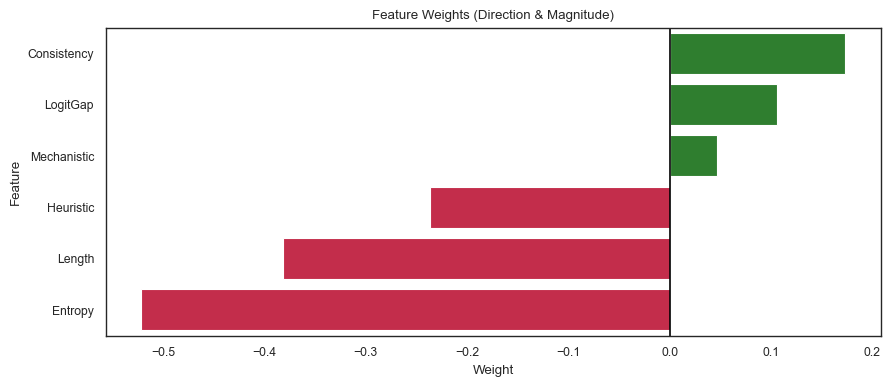

              precision    recall  f1-score   support

           0       0.45      0.60      0.51       558
           1       0.81      0.70      0.75      1378

    accuracy                           0.67      1936
   macro avg       0.63      0.65      0.63      1936
weighted avg       0.71      0.67      0.68      1936



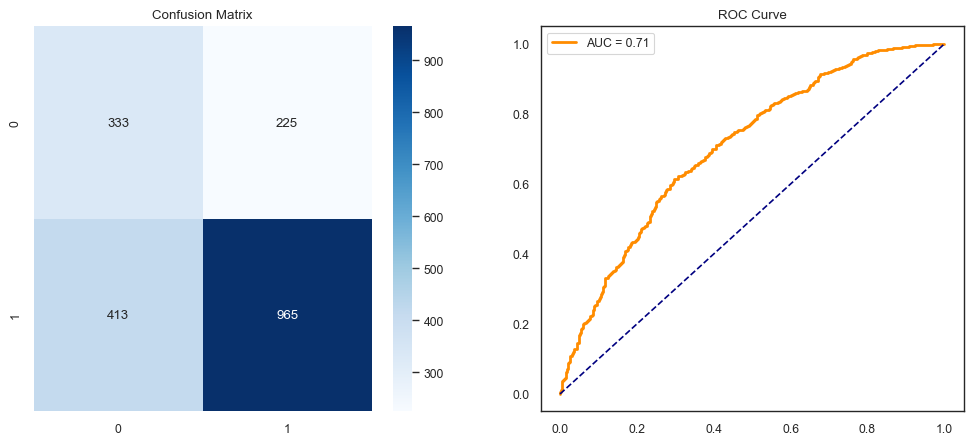

Metric,Shift (SD),Mean,SD,Vis
Entropy,-0.24 SD,0.047,0.014,
LogitGap,+0.13 SD,0.051,0.044,
Heuristic,-0.23 SD,0.437,0.022,
Mechanistic,-0.07 SD,0.965,0.005,
Consistency,-0.14 SD,0.933,0.030,
Length,+1.05 SD,348.577,47.864,
Metric,Shift (SD),Mean,SD,Vis
Entropy,+1.98 SD,0.134,0.027,
LogitGap,-0.12 SD,0.030,0.032,
Heuristic,+0.02 SD,0.447,0.035,


Generating t-SNE...


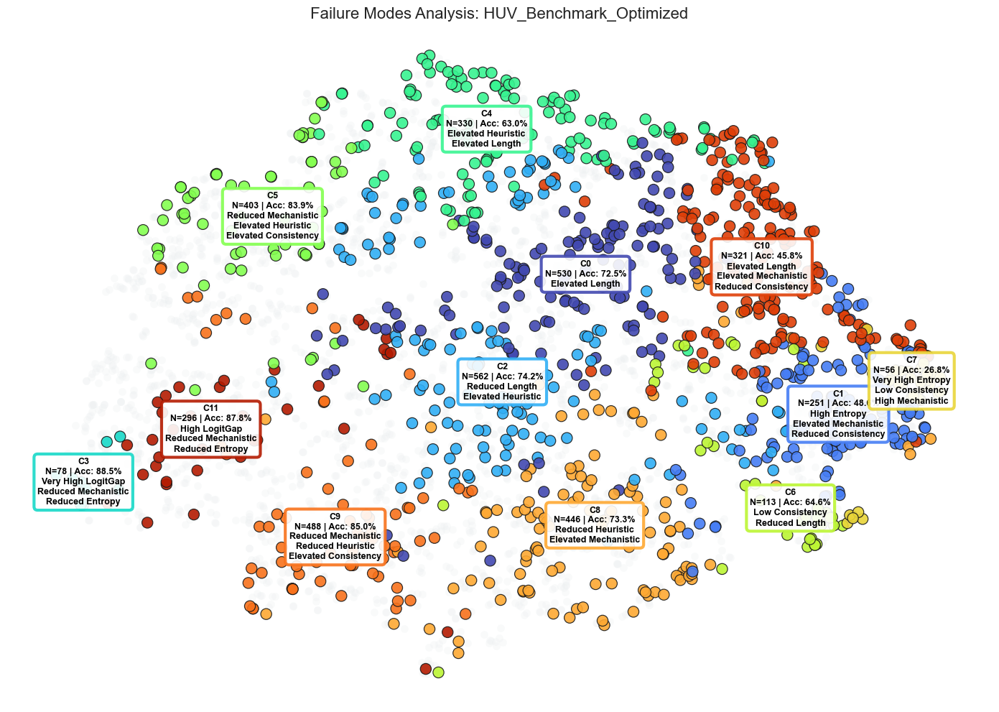

✅ Predictors generated and ready for validation.


In [11]:
import analysis_utils as utils
import pandas as pd
import numpy as np
import importlib

# 1. Setup & Load
importlib.reload(utils)
print("Loading Data & Generating Artifacts...")
df, metrics, exp_info = utils.load_data_universal("db/results.sqlite")

# 2. Define Feature Set
metrics_to_use = ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency', 'Length']

# 3. Generate Fusion Model (The Supervised Classifier)
# This returns a callable function: predict(df) -> (probs, labels)
classifier_artifact = utils.run_detailed_logistic_regression(df, features=metrics_to_use)

# 4. Generate Clustering Model (The Failure Mode Detector)
# This returns a callable function for assigning clusters
cluster_predictor = utils.run_failure_modes_dashboard(df, exp_info, features=metrics_to_use)

print("✅ Predictors generated and ready for validation.")

,Type,AUROC (↑),AUARC (↑),ECE (↓)
Method,,,,
Entropy,Single Signal,0.651795,0.755420,0.134534
LogitGap,Single Signal,0.402333,0.630599,0.238554
Heuristic,Single Signal,0.529599,0.689935,0.229074
Mechanistic,Single Signal,0.656952,0.761679,0.488915
Consistency,Single Signal,0.623199,0.761679,0.212600
Length,Single Signal,0.623544,0.737932,0.242811
Fusion Model (Ours),Unified,0.705498,0.783990,0.190054


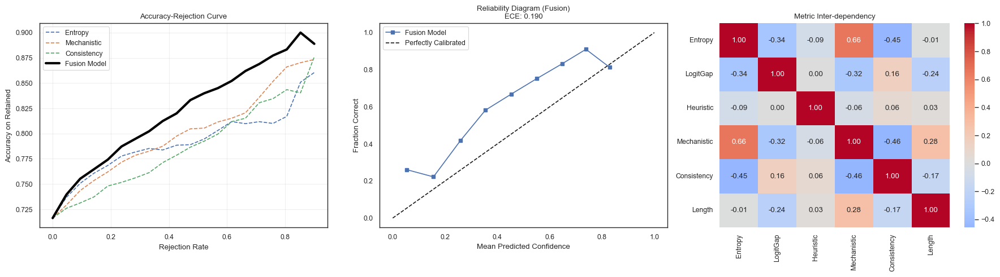

### 📊 Statistical Robustness of Clusters

,Rich_Label,Count,Accuracy,CI_Lower,CI_Upper
0,C0 N=530 | Acc: 72.5% Elevated Length,530,72.5%,68.5%,76.1%
1,C1 N=251 | Acc: 48.6% High Entropy Elevated Mechanistic Reduced Consistency,251,48.6%,42.5%,54.8%
2,C10 N=321 | Acc: 45.8% Elevated Length Elevated Mechanistic Reduced Consistency,321,45.8%,40.4%,51.3%
3,C11 N=296 | Acc: 87.8% High LogitGap Reduced Mechanistic Reduced Entropy,296,87.8%,83.6%,91.1%
4,C2 N=562 | Acc: 74.2% Reduced Length Elevated Heuristic,562,74.2%,70.4%,77.6%
5,C3 N=78 | Acc: 88.5% Very High LogitGap Reduced Mechanistic Reduced Entropy,78,88.5%,79.5%,93.8%
6,C4 N=330 | Acc: 63.0% Elevated Heuristic Elevated Length,330,63.0%,57.7%,68.1%
7,C5 N=403 | Acc: 83.9% Reduced Mechanistic Elevated Heuristic Elevated Consistency,403,83.9%,80.0%,87.1%
8,C6 N=113 | Acc: 64.6% Low Consistency Reduced Length,113,64.6%,55.4%,72.8%
9,C7 N=56 | Acc: 26.8% Very High Entropy Low Consistency High Mechanistic,56,26.8%,17.0%,39.6%


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, brier_score_loss
from sklearn.calibration import calibration_curve
from scipy.stats import norm
from IPython.display import display, HTML, Markdown

# --- 1. VALIDATION HELPER FUNCTIONS ---

def compute_ece(probs, y_true, n_bins=10):
    """Calculates Expected Calibration Error (ECE)."""
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        mask = (probs > bin_boundaries[i]) & (probs <= bin_boundaries[i+1])
        if not np.any(mask): continue
        bin_prob = np.mean(probs[mask])
        bin_acc = np.mean(y_true[mask])
        ece += np.abs(bin_prob - bin_acc) * (np.sum(mask) / len(probs))
    return ece

def compute_auarc(uncertainty_scores, y_true):
    """Calculates Area Under Accuracy-Rejection Curve (AUARC)."""
    # Sort by uncertainty (ascending: low uncertainty first)
    data = pd.DataFrame({'unc': uncertainty_scores, 'correct': y_true})
    data = data.sort_values('unc', ascending=True)
    
    rejection_rates = np.linspace(0, 0.95, 50)
    accuracies = []
    n = len(data)
    
    for r in rejection_rates:
        keep_n = int(n * (1 - r))
        if keep_n < 1: break
        subset = data.head(keep_n)
        accuracies.append(subset['correct'].mean())
        
    return np.trapz(accuracies, rejection_rates)

def wilson_score_interval(correct, total, confidence=0.95):
    """Calculates Confidence Interval for small sample sizes."""
    if total == 0: return 0, 0
    p_hat = correct / total
    z = norm.ppf(1 - (1 - confidence) / 2)
    denominator = 1 + z**2/total
    center = (p_hat + z**2 / (2*total)) / denominator
    spread = z * np.sqrt((p_hat*(1-p_hat) + z**2/(4*total)) / total) / denominator
    return max(0, center - spread), min(1, center + spread)

# --- 2. COMPUTE METRICS ---

# Get predictions from the artifact generated in Cell 1
probs_fusion, _ = classifier_artifact(df)

results = []

# A. Evaluate Single Metrics
for m in metrics_to_use:
    # Invert metrics where Higher = More Uncertain
    if m in ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Length']:
        uncertainty = df[m].fillna(df[m].max())
        confidence_proxy = 1 - ((uncertainty - uncertainty.min()) / (uncertainty.max() - uncertainty.min()))
    else:
        confidence_proxy = df[m].fillna(0) # Consistency is already "Confidence"
    
    auroc = roc_auc_score(df['Correct'], confidence_proxy)
    ece = compute_ece(confidence_proxy.values, df['Correct'].values)
    auarc = compute_auarc(uncertainty.values, df['Correct'].values) 
    
    results.append({'Method': m, 'Type': 'Single Signal', 'AUROC (↑)': auroc, 'AUARC (↑)': auarc, 'ECE (↓)': ece})

# B. Evaluate Fusion Model
auroc_f = roc_auc_score(df['Correct'], probs_fusion)
ece_f = compute_ece(probs_fusion, df['Correct'].values)
auarc_f = compute_auarc(1 - probs_fusion, df['Correct'].values)

results.append({'Method': '<b>Fusion Model (Ours)</b>', 'Type': 'Unified', 'AUROC (↑)': auroc_f, 'AUARC (↑)': auarc_f, 'ECE (↓)': ece_f})

display(HTML("<h2>🚀 Uncertainty Quantification Validation Report</h2>"))
display(HTML(pd.DataFrame(results).set_index('Method').to_html(escape=False)))

# --- 3. VISUALIZATIONS ---

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot A: Accuracy-Rejection Curves 
for m in ['Entropy', 'Mechanistic', 'Consistency']:
    data = pd.DataFrame({'unc': df[m], 'correct': df['Correct']}).sort_values('unc', ascending=(m!='Consistency'))
    rejection_rates = np.linspace(0, 0.9, 20)
    accs = [data.head(int(len(data)*(1-r)))['correct'].mean() for r in rejection_rates]
    axes[0].plot(rejection_rates, accs, label=m, linestyle='--')

# Fusion Curve
data_f = pd.DataFrame({'unc': 1-probs_fusion, 'correct': df['Correct']}).sort_values('unc')
accs_f = [data_f.head(int(len(data_f)*(1-r)))['correct'].mean() for r in rejection_rates]
axes[0].plot(rejection_rates, accs_f, label='Fusion Model', linewidth=3, color='black')

axes[0].set_title("Accuracy-Rejection Curve")
axes[0].set_xlabel("Rejection Rate")
axes[0].set_ylabel("Accuracy on Retained")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot B: Calibration Curve
frac_pos, mean_pred = calibration_curve(df['Correct'], probs_fusion, n_bins=10)
axes[1].plot(mean_pred, frac_pos, "s-", label="Fusion Model")
axes[1].plot([0, 1], [0, 1], "k--", label="Perfectly Calibrated")
axes[1].set_title(f"Reliability Diagram (Fusion)\nECE: {ece_f:.3f}")
axes[1].set_xlabel("Mean Predicted Confidence")
axes[1].set_ylabel("Fraction Correct")
axes[1].legend()

# Plot C: Correlation Heatmap
corr = df[metrics_to_use].corr(method='spearman')
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0, ax=axes[2])
axes[2].set_title("Metric Inter-dependency")
plt.tight_layout()
plt.show()

# --- 4. CLUSTER ROBUSTNESS ---

# Use the cluster predictor from Cell 1
_, labels = cluster_predictor(df)
df['Rich_Label'] = labels
cluster_stats = df.groupby('Rich_Label').agg(Count=('Correct', 'count'), Accuracy=('Correct', 'mean')).reset_index()

# Apply Wilson Score Interval
cluster_stats[['CI_Lower', 'CI_Upper']] = cluster_stats.apply(
    lambda row: pd.Series(wilson_score_interval(row['Accuracy']*row['Count'], row['Count'])), axis=1
)

display(Markdown("### 📊 Statistical Robustness of Clusters"))
display(HTML(cluster_stats.style.format({'Accuracy': '{:.1%}', 'CI_Lower': '{:.1%}', 'CI_Upper': '{:.1%}'}).to_html()))

if not cluster_stats[cluster_stats['Count'] < 5].empty:
    display(Markdown("⚠️ **Warning:** Some clusters have n<5 samples."))

Loading Data & Generating Artifacts...
Loading Run: HUV_Benchmark_Optimized (ID: 1)


### Full Logistic Regression Analysis

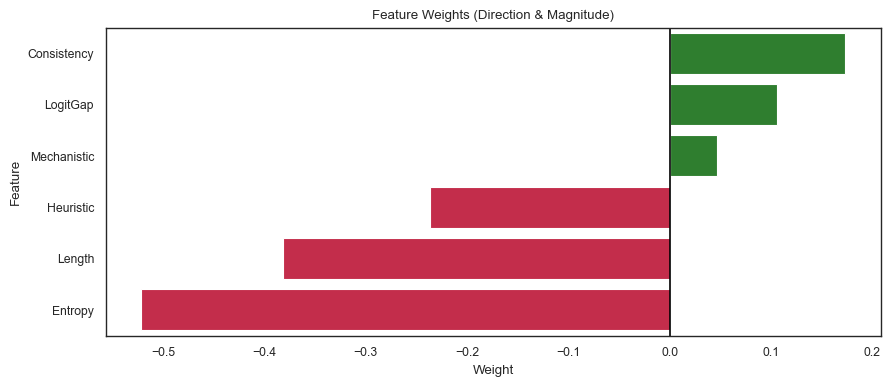

              precision    recall  f1-score   support

           0       0.45      0.60      0.51       558
           1       0.81      0.70      0.75      1378

    accuracy                           0.67      1936
   macro avg       0.63      0.65      0.63      1936
weighted avg       0.71      0.67      0.68      1936



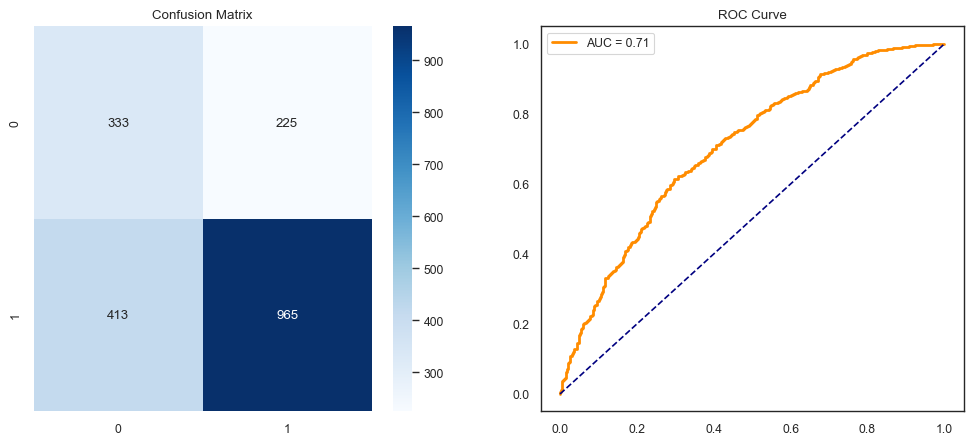

,Type,AUROC (↑),AUARC (↑),ECE (↓)
Method,,,,
Entropy,Single Signal,0.651795,0.755420,0.134534
LogitGap,Single Signal,0.402333,0.630599,0.238554
Heuristic,Single Signal,0.529599,0.689935,0.229074
Mechanistic,Single Signal,0.656952,0.761679,0.488915
Consistency,Single Signal,0.623199,0.761679,0.212600
Length,Single Signal,0.623544,0.737932,0.242811
Fusion Model (Ours),Unified,0.705498,0.783990,0.190054


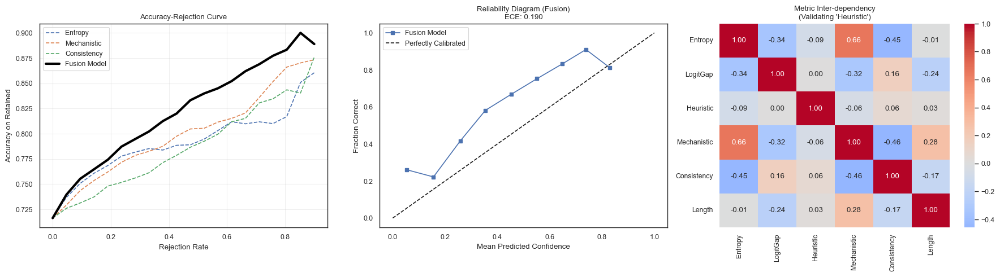

Metric,Shift (SD),Mean,SD,Vis
Entropy,-0.24 SD,0.047,0.014,
LogitGap,+0.13 SD,0.051,0.044,
Heuristic,-0.23 SD,0.437,0.022,
Mechanistic,-0.07 SD,0.965,0.005,
Consistency,-0.14 SD,0.933,0.030,
Length,+1.05 SD,348.577,47.864,
Metric,Shift (SD),Mean,SD,Vis
Entropy,+1.98 SD,0.134,0.027,
LogitGap,-0.12 SD,0.030,0.032,
Heuristic,+0.02 SD,0.447,0.035,


Generating t-SNE...


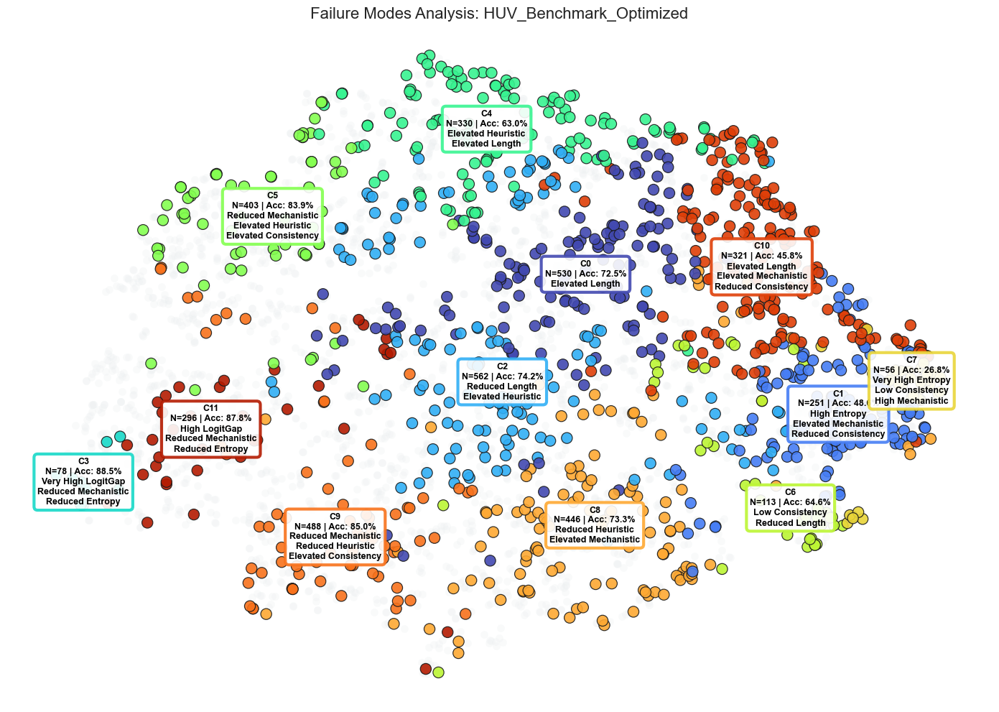

### 📊 Statistical Robustness of Clusters

,Rich_Label,Count,Accuracy,CI_Lower,CI_Upper
0,C0 N=530 | Acc: 72.5% Elevated Length,530,72.5%,68.5%,76.1%
1,C1 N=251 | Acc: 48.6% High Entropy Elevated Mechanistic Reduced Consistency,251,48.6%,42.5%,54.8%
2,C10 N=321 | Acc: 45.8% Elevated Length Elevated Mechanistic Reduced Consistency,321,45.8%,40.4%,51.3%
3,C11 N=296 | Acc: 87.8% High LogitGap Reduced Mechanistic Reduced Entropy,296,87.8%,83.6%,91.1%
4,C2 N=562 | Acc: 74.2% Reduced Length Elevated Heuristic,562,74.2%,70.4%,77.6%
5,C3 N=78 | Acc: 88.5% Very High LogitGap Reduced Mechanistic Reduced Entropy,78,88.5%,79.5%,93.8%
6,C4 N=330 | Acc: 63.0% Elevated Heuristic Elevated Length,330,63.0%,57.7%,68.1%
7,C5 N=403 | Acc: 83.9% Reduced Mechanistic Elevated Heuristic Elevated Consistency,403,83.9%,80.0%,87.1%
8,C6 N=113 | Acc: 64.6% Low Consistency Reduced Length,113,64.6%,55.4%,72.8%
9,C7 N=56 | Acc: 26.8% Very High Entropy Low Consistency High Mechanistic,56,26.8%,17.0%,39.6%


In [10]:
import analysis_utils as utils
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import brier_score_loss, roc_auc_score
from scipy.stats import norm
import importlib
from IPython.display import display, HTML, Markdown

# Reload utils to ensure we have the latest PredictorArtifact class
importlib.reload(utils)

# --- 1. NEW VALIDATION FUNCTIONS (Addressing Ruchi's Feedback) ---

def compute_ece(probs, y_true, n_bins=10):
    """Calculates Expected Calibration Error (ECE)."""
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        # Select indices for this bin
        mask = (probs > bin_boundaries[i]) & (probs <= bin_boundaries[i+1])
        if not np.any(mask): continue
        
        # Calculate gap between avg prob and avg accuracy in this bin
        bin_prob = np.mean(probs[mask])
        bin_acc = np.mean(y_true[mask])
        ece += np.abs(bin_prob - bin_acc) * (np.sum(mask) / len(probs))
    return ece

def compute_auarc(uncertainty_scores, y_true):
    """
    Calculates Area Under Accuracy-Rejection Curve (AUARC).
    Lower uncertainty = Higher Confidence = Keep.
    """
    # Sort by uncertainty (ascending: low uncertainty first)
    data = pd.DataFrame({'unc': uncertainty_scores, 'correct': y_true})
    data = data.sort_values('unc', ascending=True)
    
    n = len(data)
    rejection_rates = np.linspace(0, 0.95, 50) # Don't reject 100%
    accuracies = []
    
    for r in rejection_rates:
        keep_n = int(n * (1 - r))
        if keep_n < 1: break
        # Keep the top (1-r)% most confident (lowest uncertainty)
        # Since we sorted ascending, we keep the head
        subset = data.head(keep_n)
        accuracies.append(subset['correct'].mean())
        
    # Simple Trapezoidal rule
    return np.trapz(accuracies, rejection_rates)

def wilson_score_interval(correct, total, confidence=0.95):
    """Calculates Confidence Interval for small sample sizes."""
    if total == 0: return 0, 0
    p_hat = correct / total
    z = norm.ppf(1 - (1 - confidence) / 2)
    
    denominator = 1 + z**2/total
    center = (p_hat + z**2 / (2*total)) / denominator
    spread = z * np.sqrt((p_hat*(1-p_hat) + z**2/(4*total)) / total) / denominator
    
    return max(0, center - spread), min(1, center + spread)

# --- 2. LOAD DATA & PREPARE ---

print("Loading Data & Generating Artifacts...")
df, metrics, exp_info = utils.load_data_universal("db/results.sqlite")

# Define feature set
metrics_to_use = ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency', 'Length']

# --- 3. TRAIN FUSION MODEL (Logistic Regression) ---

# We use this as the "Unified Framework" prediction
classifier_artifact = utils.run_detailed_logistic_regression(df, features=metrics_to_use)
probs_fusion, _ = classifier_artifact(df)

# --- 4. COMPREHENSIVE VALIDATION REPORT ---

display(HTML("<h2>🚀 Uncertainty Quantification Validation Report</h2>"))

results = []

# A. Evaluate Single Metrics
for m in metrics_to_use:
    # Invert metrics where Higher = More Uncertain (Entropy, LogitGap)
    # We want "Confidence Scores" for ECE/AUROC where Higher = Better
    if m in ['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Length']:
        # Simple inversion for ranking
        uncertainty = df[m].fillna(df[m].max())
        confidence_proxy = 1 - ((uncertainty - uncertainty.min()) / (uncertainty.max() - uncertainty.min()))
    else:
        # Consistency is already a confidence score
        confidence_proxy = df[m].fillna(0)
    
    auroc = roc_auc_score(df['Correct'], confidence_proxy)
    ece = compute_ece(confidence_proxy.values, df['Correct'].values)
    auarc = compute_auarc(uncertainty.values, df['Correct'].values) # Pass raw uncertainty for Rejection
    
    results.append({
        'Method': m,
        'Type': 'Single Signal',
        'AUROC (↑)': auroc,
        'AUARC (↑)': auarc,
        'ECE (↓)': ece
    })

# B. Evaluate Fusion Model (The Classifier)
# The classifier outputs probability of being Correct (Confidence)
# Uncertainty = 1 - Prob
auroc_f = roc_auc_score(df['Correct'], probs_fusion)
ece_f = compute_ece(probs_fusion, df['Correct'].values)
auarc_f = compute_auarc(1 - probs_fusion, df['Correct'].values)

results.append({
    'Method': '<b>Fusion Model (Ours)</b>',
    'Type': 'Unified',
    'AUROC (↑)': auroc_f,
    'AUARC (↑)': auarc_f,
    'ECE (↓)': ece_f
})

# Display Table
res_df = pd.DataFrame(results).set_index('Method')
display(HTML(res_df.to_html(escape=False)))

# --- 5. VISUALIZATIONS ---

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot A: Accuracy-Rejection Curves 
for m in ['Entropy', 'Mechanistic', 'Consistency']:
    data = pd.DataFrame({'unc': df[m], 'correct': df['Correct']}).sort_values('unc', ascending=(m!='Consistency'))
    rejection_rates = np.linspace(0, 0.9, 20)
    accs = [data.head(int(len(data)*(1-r)))['correct'].mean() for r in rejection_rates]
    axes[0].plot(rejection_rates, accs, label=m, linestyle='--')

# Fusion Curve
data_f = pd.DataFrame({'unc': 1-probs_fusion, 'correct': df['Correct']}).sort_values('unc')
accs_f = [data_f.head(int(len(data_f)*(1-r)))['correct'].mean() for r in rejection_rates]
axes[0].plot(rejection_rates, accs_f, label='Fusion Model', linewidth=3, color='black')

axes[0].set_title("Accuracy-Rejection Curve")
axes[0].set_xlabel("Rejection Rate")
axes[0].set_ylabel("Accuracy on Retained")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot B: Calibration Curve 
from sklearn.calibration import calibration_curve
frac_pos, mean_pred = calibration_curve(df['Correct'], probs_fusion, n_bins=10)
axes[1].plot(mean_pred, frac_pos, "s-", label="Fusion Model")
axes[1].plot([0, 1], [0, 1], "k--", label="Perfectly Calibrated")
axes[1].set_title(f"Reliability Diagram (Fusion)\nECE: {ece_f:.3f}")
axes[1].set_xlabel("Mean Predicted Confidence")
axes[1].set_ylabel("Fraction Correct")
axes[1].legend()

# Plot C: Heuristic Correlation Analysis (Validation of Heuristic)
# Ruchi asked for definition/validation. Since we can't define it (pre-computed),
# we show what it correlates with.
corr = df[metrics_to_use].corr(method='spearman')
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0, ax=axes[2])
axes[2].set_title("Metric Inter-dependency\n(Validating 'Heuristic')")

plt.tight_layout()
plt.show()

# --- 6. UPDATE CLUSTERING WITH CONFIDENCE INTERVALS ---

# Run the clustering artifact
cluster_predictor = utils.run_failure_modes_dashboard(df, exp_info, features=metrics_to_use)

# We now manually inject the statistical rigor Ruchi requested into the cluster output
_, labels = cluster_predictor(df)
df['Rich_Label'] = labels
cluster_stats = df.groupby('Rich_Label').agg(
    Count=('Correct', 'count'),
    Accuracy=('Correct', 'mean')
).reset_index()

# Calculate CIs
cluster_stats[['CI_Lower', 'CI_Upper']] = cluster_stats.apply(
    lambda row: pd.Series(wilson_score_interval(row['Accuracy']*row['Count'], row['Count'])), axis=1
)

display(Markdown("### 📊 Statistical Robustness of Clusters"))
display(HTML(cluster_stats.style.format({
    'Accuracy': '{:.1%}',
    'CI_Lower': '{:.1%}', 
    'CI_Upper': '{:.1%}'
}).to_html()))

# Warning for small clusters
small_clusters = cluster_stats[cluster_stats['Count'] < 5]
if not small_clusters.empty:
    display(Markdown(f"⚠️ **Warning:** {len(small_clusters)} clusters have n<5 samples. Interpret with caution."))

In [ ]:
utils.run_full_analysis(df,metrics)

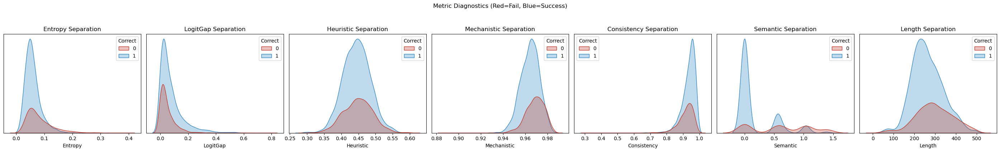

In [2]:
utils.plot_metric_diagnostics(df, metrics = metrics)

Metric,Shift (SD),Mean,SD,Vis
Entropy,-0.24 SD,0.047,0.014,
LogitGap,+0.13 SD,0.051,0.044,
Heuristic,-0.23 SD,0.437,0.022,
Mechanistic,-0.07 SD,0.965,0.005,
Consistency,-0.14 SD,0.933,0.030,
Length,+1.05 SD,348.577,47.864,
Metric,Shift (SD),Mean,SD,Vis
Entropy,+1.98 SD,0.134,0.027,
LogitGap,-0.12 SD,0.030,0.032,
Heuristic,+0.02 SD,0.447,0.035,


Generating t-SNE...


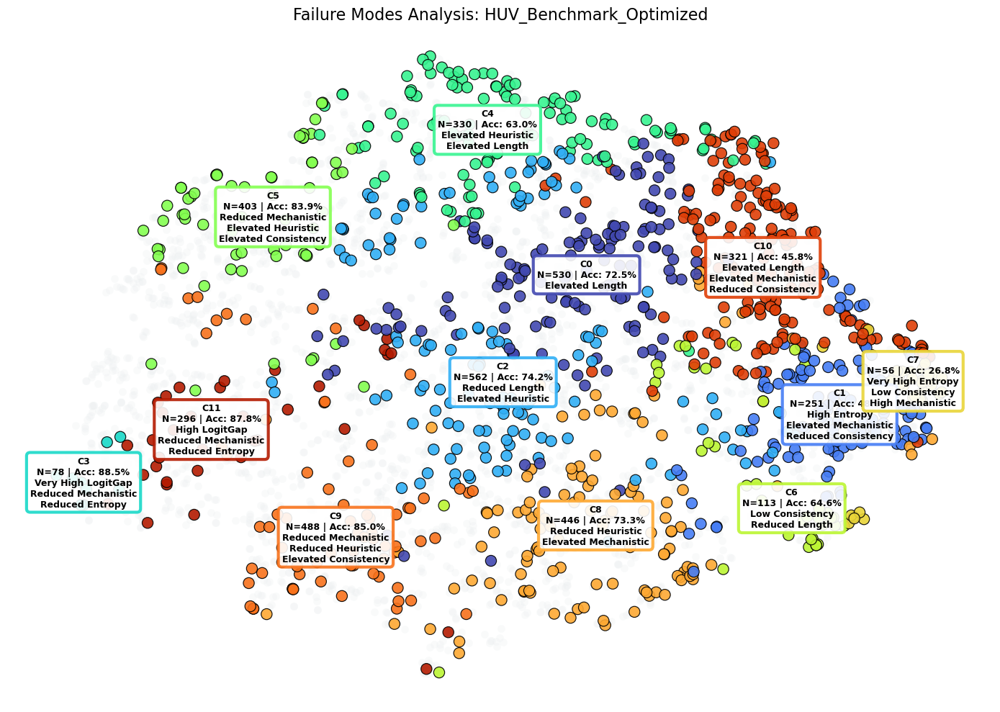

In [3]:
utils.run_failure_modes_dashboard(df, exp_info, features=['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency',  'Length'])

### Feature Subset Analysis (Exhaustive Search)

,Num_Features,Features,AUC,% of Max
0,4,"Entropy, LogitGap, Consistency, Length",0.7154,100.0%
1,3,"Entropy, Consistency, Length",0.7147,99.9%
2,3,"Entropy, LogitGap, Length",0.7139,99.8%
3,5,"Entropy, LogitGap, Mechanistic, Consistency, Length",0.7136,99.8%
4,4,"Entropy, Mechanistic, Consistency, Length",0.7130,99.7%
5,2,"Entropy, Length",0.7130,99.7%
6,4,"Entropy, LogitGap, Mechanistic, Length",0.7108,99.4%
7,3,"Entropy, Mechanistic, Length",0.7102,99.3%
8,5,"Entropy, LogitGap, Heuristic, Consistency, Length",0.7090,99.1%
9,4,"Entropy, Heuristic, Consistency, Length",0.7080,99.0%


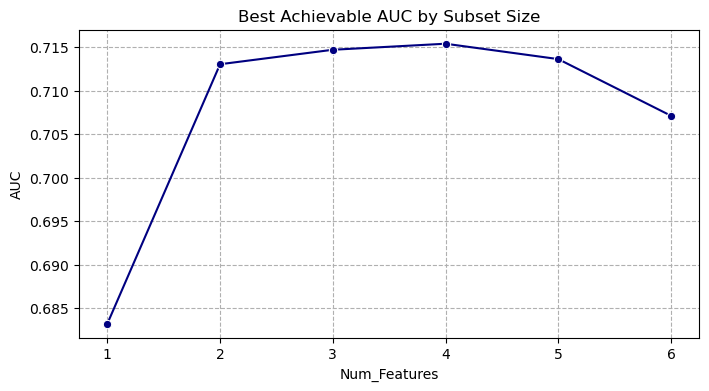

In [4]:
utils.run_feature_subset_search(df, features=['Entropy', 'LogitGap', 'Heuristic', 'Mechanistic', 'Consistency',  'Length'])

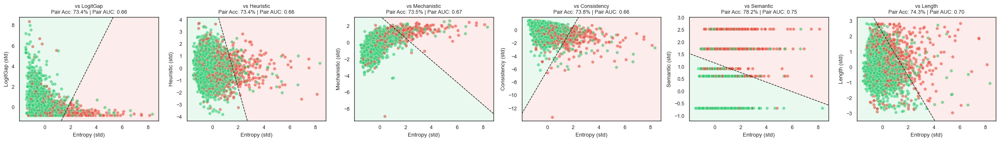

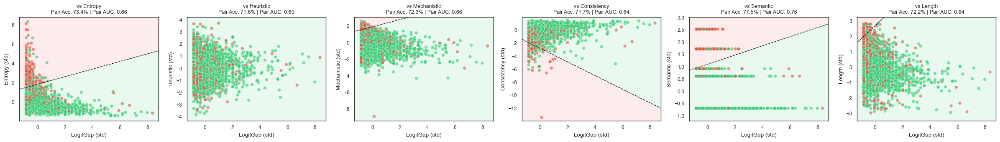

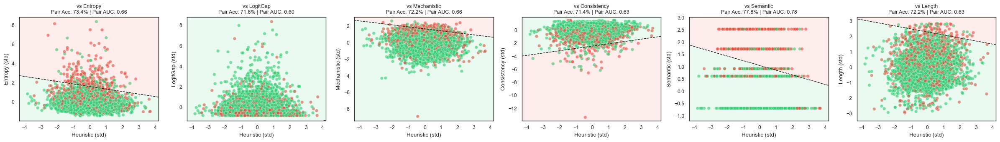

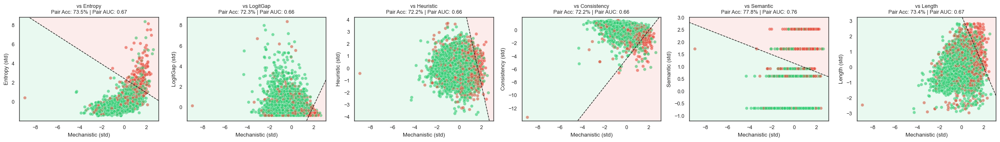

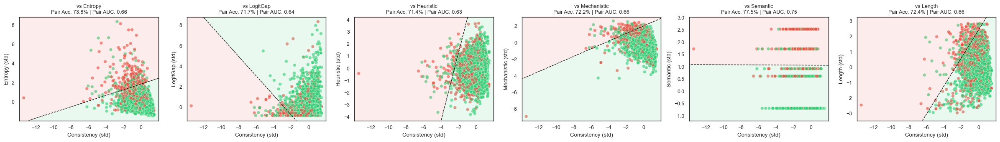

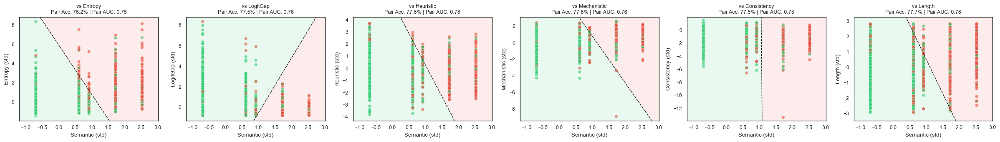

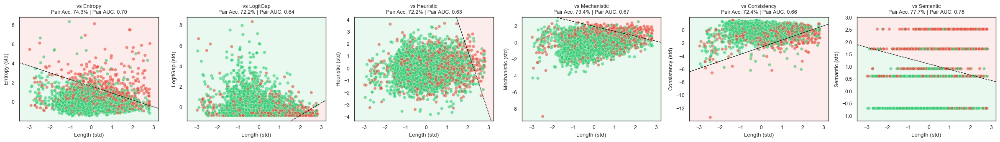

In [5]:
utils.run_full_analysis(df,metrics)

### Full Logistic Regression Analysis

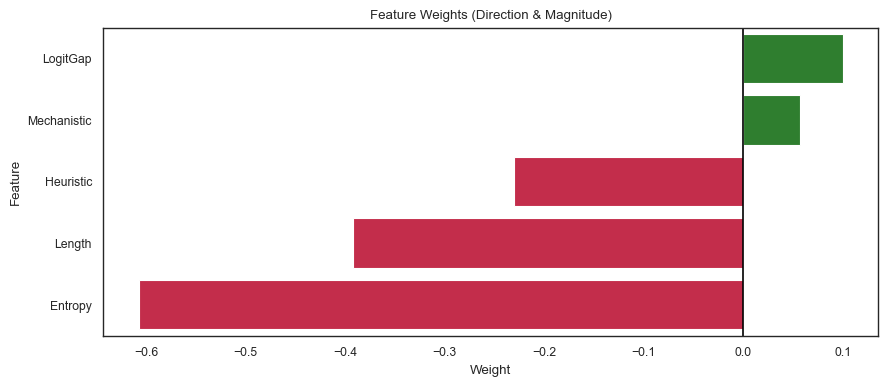

              precision    recall  f1-score   support

           0       0.45      0.59      0.51       558
           1       0.81      0.70      0.75      1378

    accuracy                           0.67      1936
   macro avg       0.63      0.65      0.63      1936
weighted avg       0.71      0.67      0.68      1936



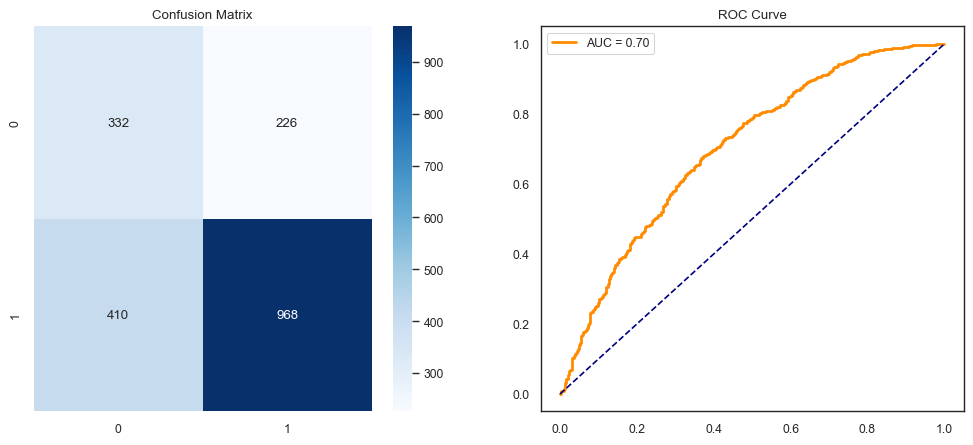

In [6]:
utils.run_detailed_logistic_regression(df)